In [2]:
import DA_functions as da
import numpy as np
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as md
import seaborn as sb

%matplotlib inline 
# %matplotlib notebook

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Atzmaus data - 10/06 07:30 - 19/06 07:00 - PM-2.5 and PM-1

Load AQS data

In [3]:
import pandas as pd

# I first open it in excel online and fix the first rows (delete and give column names)
df = pd.read_excel('ZoeysData/StationDataAtzmautAll.xlsx')

In [4]:
units = ['ppb','µg/m3','ppb','ppb','µg/m3','ppm','ppb','ppb','ppb','time']
df.columns = df.columns.str.replace(' ', '')

clean

In [5]:
# remove weird data at the end
df.drop(df.iloc[-8:,:].index, inplace=True)

In [6]:
# reset index
df.reset_index(drop=True, inplace=True)

In [7]:
# df['date'].apply(type).head()

## Data available in Atzmaut station

### 1. AQM
### Is it reliable ? 

In [8]:
df.head()
df.tail()
# df.columns[:-1]

,SO2,PM1,TOLUENE,Benzen,PM2.5,PM2.5.1,CO,NOx,NO,date
0,1.7,16,0.35,0,22.9,0.3,33.7,37.6,4,06/06/2018 00:05
1,1.1,16,0.35,0,26.6,0.3,26.1,26.2,0.7,06/06/2018 00:10
2,Calib,15,0.35,0,27.3,0.3,18.2,18.8,0.7,06/06/2018 00:15
3,Calib,16,0.29,0.01,24,0.3,13.9,13.6,0,06/06/2018 00:20
4,Calib,16,0.28,0.01,24.6,0.3,15.6,16.1,0.4,06/06/2018 00:25


,SO2,PM1,TOLUENE,Benzen,PM2.5,PM2.5.1,CO,NOx,NO,date
4303,0,5,NoData,NoData,8.1,0.3,6.8,7,0.1,20/06/2018 22:40
4304,0,3,NoData,NoData,7.2,0.3,11.8,12.7,0.9,20/06/2018 22:45
4305,0,2,NoData,NoData,4.4,0.3,8.2,8.1,0,20/06/2018 22:50
4306,0,0,NoData,NoData,6.8,0.3,10.9,11.9,1.1,20/06/2018 22:55
4307,0,-1,NoData,NoData,8.6,0.3,7.9,7.9,0.2,20/06/2018 23:00


In [9]:
# change type to numeric
for c in df.columns[:-1]:
    df[c] = pd.to_numeric(df[c], errors='coerce')

In [10]:
# change the date to a normal format based on df.loc[0,'date'] and df.loc[len(df)-1,'date']. notice the days and months of my dates are reversed compared to the standard
df.date = pd.date_range(start='06/06/2018 00:05',end='20/06/2018 23:00',freq='5min')

In [11]:
# reset index
df.reset_index(drop=True, inplace=True)

In [12]:
# X - now take rows between 7.6.2018 18:30 and 16.6.2018 18:00
# V - now take rows between 10.6.2018 07:30 and 19.6.2018 07:00
mask = (df.date < "2018-06-10 07:30") | (df.date > "2018-06-19 07:00")
df.drop(df.loc[mask,:].index, inplace=True)

In [13]:
# reset index 
df.reset_index(drop=True, inplace=True)

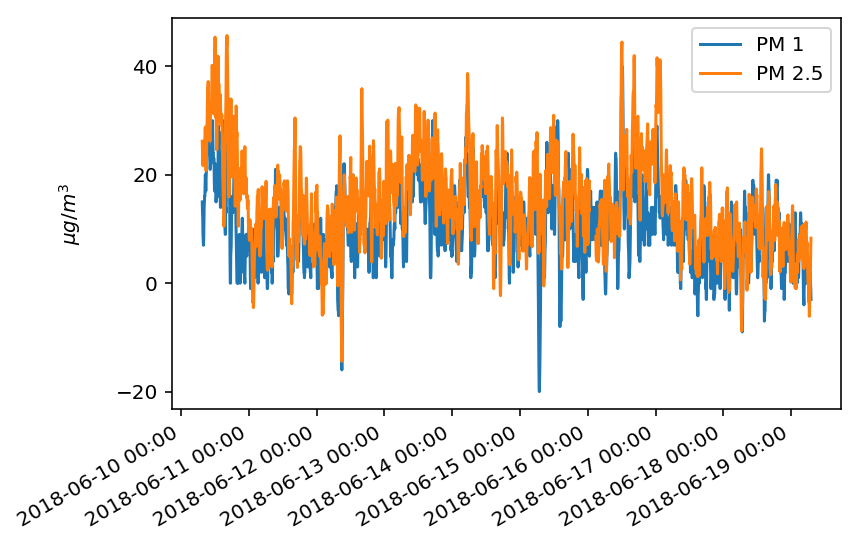

In [14]:
import matplotlib.pyplot as plt
import matplotlib.dates as md
import datetime 

%config InlineBackend.figure_format = 'retina'
# %matplotlib notebook
# %matplotlib inline

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots()

ax.plot(df['date'], df['PM1'])
ax.plot(df['date'], df['PM2.5'])
ax.xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d %H:%M"))
ax.legend(('PM 1', 'PM 2.5'),loc='upper right')
# plt.title('PM concentration\n measured by AQM Atzmaut\n between\n ' + df_AQM['date'][0].strftime(fmt) + ' and '+ df_AQM['date'][len(df_AQM)-1].strftime(fmt))
ax.set_ylabel(r'$\mu g/m^3$',labelpad=16)
# Tell matplotlib to interpret the x-axis values as dates
ax.xaxis_date()

# Make space for and rotate the x-axis tick labels
fig.autofmt_xdate()
plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['font.size'] = 20
plt.show();

In [15]:
# change negative values data to NaN
for c in df.columns[:-1]:
    df[c] = np.where(df[c] < 0 , np.NaN , df[c])

In [16]:
df_AQM = df
df_AQM.drop(df_AQM.head(1).index, inplace=True)

In [17]:
df_AQM.head()
df_AQM.tail()

,SO2,PM1,TOLUENE,Benzen,PM2.5,PM2.5.1,CO,NOx,NO,date
1,0.0,13.0,NaN,NaN,24.0,0.4,14.9,35.2,20.2,2018-06-10 07:35:00
2,0.0,12.0,NaN,NaN,22.4,0.4,25.2,44.6,19.4,2018-06-10 07:40:00
3,0.0,9.0,NaN,NaN,21.7,0.5,23.5,46.6,22.6,2018-06-10 07:45:00
4,0.0,8.0,NaN,NaN,22.5,0.5,34.7,74.3,39.9,2018-06-10 07:50:00
5,0.0,7.0,NaN,NaN,23.9,0.4,17.2,29.5,12.8,2018-06-10 07:55:00


,SO2,PM1,TOLUENE,Benzen,PM2.5,PM2.5.1,CO,NOx,NO,date
2582,0.0,2.0,NaN,NaN,NaN,0.3,14.0,18.7,5.2,2018-06-19 06:40:00
2583,0.2,2.0,NaN,NaN,0.1,0.3,10.2,16.0,5.6,2018-06-19 06:45:00
2584,0.2,0.0,NaN,NaN,3.4,0.3,12.1,17.0,5.0,2018-06-19 06:50:00
2585,0.1,NaN,NaN,NaN,6.4,0.3,7.7,11.7,4.1,2018-06-19 06:55:00
2586,0.2,NaN,NaN,NaN,8.3,0.3,8.8,12.9,4.1,2018-06-19 07:00:00


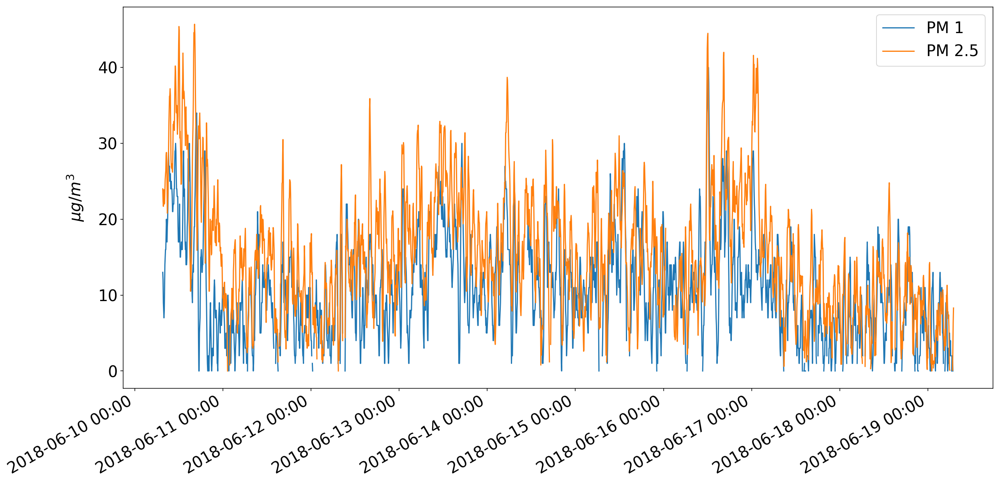

In [18]:
import matplotlib.pyplot as plt
import matplotlib.dates as md
import datetime 

%config InlineBackend.figure_format = 'retina'
# %matplotlib notebook
# %matplotlib inline

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots()

ax.plot(df_AQM['date'], df_AQM['PM1'])
ax.plot(df_AQM['date'], df_AQM['PM2.5'])
ax.xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d %H:%M"))
ax.legend(('PM 1', 'PM 2.5'),loc='upper right')
# plt.title('PM concentration\n measured by AQM Atzmaut\n between\n ' + df_AQM['date'][0].strftime(fmt) + ' and '+ df_AQM['date'][len(df_AQM)-1].strftime(fmt))
ax.set_ylabel(r'$\mu g/m^3$',labelpad=16)
# Tell matplotlib to interpret the x-axis values as dates
ax.xaxis_date()

# Make space for and rotate the x-axis tick labels
fig.autofmt_xdate()
plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['font.size'] = 20
plt.show();

In [19]:
plt.close('all')
plt.rcParams.update(plt.rcParamsDefault)

## MET-ONE data (number of particles in 1L)

In [20]:
# First try - with apperently wrong dates 
# df_met1_1 = pd.read_table('ZoeysData/Ohad/180607_114739_term.txt')
# df_met1_2 = pd.read_table('ZoeysData/Ohad/180608_120806_term.txt')
# df_met1_3 = pd.read_table('ZoeysData/Ohad/180609_123820_term.txt')
# df_met1_4 = pd.read_table('ZoeysData/Ohad/180610_105424_term.txt')
# df_met1_5 = pd.read_table('ZoeysData/Ohad/180611_111348_term.txt')
# df_met1_6 = pd.read_table('ZoeysData/Ohad/180612_120120_term.txt')
# df_met1_7 = pd.read_table('ZoeysData/Ohad/180613_110102_term.txt')
# df_met1_8 = pd.read_table('ZoeysData/Ohad/180614_113002_term.txt')
# df_met1_9 = pd.read_table('ZoeysData/Ohad/180615_104835_term.txt')
# df_met1_10 = pd.read_table('ZoeysData/Ohad/180616_124531_term.txt')
# df_met1_11 = pd.read_table('ZoeysData/Ohad/180617_105420_term.txt')

In [21]:
df_met1_1 = pd.read_table('ZoeysData/Ohad/180607_114739_term.txt')
df_met1_2 = pd.read_table('ZoeysData/Ohad/180608_120806_term.txt')
df_met1_3 = pd.read_table('ZoeysData/Ohad/180609_123820_term.txt')
df_met1_4 = pd.read_table('ZoeysData/Ohad/180610_105424_term.txt')
df_met1_5 = pd.read_table('ZoeysData/Ohad/180611_111348_term.txt')
df_met1_6 = pd.read_table('ZoeysData/Ohad/180612_120120_term.txt')
df_met1_7 = pd.read_table('ZoeysData/Ohad/180613_110102_term.txt')
df_met1_8 = pd.read_table('ZoeysData/Ohad/180614_113002_term.txt')
df_met1_9 = pd.read_table('ZoeysData/Ohad/180615_104835_term.txt')
df_met1_10 = pd.read_table('ZoeysData/Ohad/180616_124531_term.txt')
df_met1_11 = pd.read_table('ZoeysData/Ohad/180617_105420_term.txt')
df_met1_12 = pd.read_table('ZoeysData/Ohad/180618_122349_term.txt')
df_met1_13 = pd.read_table('ZoeysData/Ohad/180619_101942_term.txt')
df_met1_14 = pd.read_table('ZoeysData/Ohad/180620_103659_term.txt')

In [22]:
# remove the first lines
for i in range(1,15):
    var = 'df_met1_{}'.format(i)
    eval(var).drop(eval(var).iloc[0:13,:].index, inplace=True)
    # split by ','
    eval(var)['Time'], eval(var)['Loc'],eval(var)['Period'],eval(var)['Size1'],eval(var)['Count1'],eval(var)['Size2'],eval(var)['Count2'],eval(var)['Size3'],eval(var)['Count3'], eval(var)['Size4'],eval(var)['Count4'],eval(var)['Units'],eval(var)['Status'] = eval(var).iloc[:,0].str.split(',',12).str
    # reset index
    eval(var).reset_index(drop=True, inplace=True)
    # convert to datetime
    eval(var).Time = pd.to_datetime(eval(var).Time)


In [23]:
# remove the first column
for i in [1,2,4,5,6,7,8,9,10,11,12,13]:
    var = 'df_met1_{}'.format(i)
    eval(var).drop(['1'],axis=1, inplace=True)
    
df_met1_3.drop(['10'],axis=1, inplace=True)
df_met1_14.drop(['12'],axis=1, inplace=True)

## Data available in Atzmaut station

### 2. MET-ONE

In [24]:
df_met1_1.head()
df_met1_14.tail()

,Time,Loc,Period,Size1,Count1,Size2,Count2,Size3,Count3,Size4,Count4,Units,Status
0,2018-06-05 14:53:28,002,60,0.3,47649,0.5,5325,1.0,1708,2.5,367,/L,000
1,2018-06-05 14:54:28,002,60,0.3,40848,0.5,4667,1.0,1594,2.5,364,/L,000
2,2018-06-05 14:55:28,002,60,0.3,47010,0.5,6177,1.0,1746,2.5,387,/L,000
3,2018-06-05 14:56:28,002,60,0.3,47483,0.5,5773,1.0,1716,2.5,375,/L,000
4,2018-06-05 14:57:28,002,60,0.3,40007,0.5,4466,1.0,1556,2.5,336,/L,000


,Time,Loc,Period,Size1,Count1,Size2,Count2,Size3,Count3,Size4,Count4,Units,Status
2691,2018-06-20 10:32:11,002,60,0.3,33958,0.5,2685,1.0,910,2.5,248,/L,"000,*3540"
2692,2018-06-20 10:33:11,002,60,0.3,35508,0.5,2820,1.0,971,2.5,306,/L,"000,*3527"
2693,2018-06-20 10:34:11,002,60,0.3,32870,0.5,2630,1.0,910,2.5,265,/L,"000,*3523"
2694,2018-06-20 10:35:11,002,60,0.3,31640,0.5,2437,1.0,828,2.5,209,/L,"000,*3529"
2695,2018-06-20 10:36:11,002,60,0.3,33462,0.5,2826,1.0,952,2.5,249,/L,"000,*3538"


In [25]:
# join all dfs and remove doubles

In [26]:
df_metOne = pd.concat([df_met1_1,df_met1_2,df_met1_3,df_met1_4,df_met1_5,df_met1_6,df_met1_7,df_met1_8,df_met1_9,df_met1_10,df_met1_11,df_met1_12,df_met1_13,df_met1_14],
          axis=0, join='inner', join_axes=None, ignore_index=True,
          keys=None, levels=None, names=None, verify_integrity=True,
          copy=True)

In [27]:
# find duplicates 
a = df_metOne.duplicated(subset='Time', keep='first')
ind = np.transpose(np.where(a==True))
np.shape(ind)
ind2 = np.squeeze(ind)
np.shape(ind2)
df_metOne.drop(df_metOne.iloc[ind2,:].index, inplace=True)
df_metOne.reset_index(drop=True, inplace=True)

(16445, 1)

(16445,)

In [28]:
df_metOne.Time = pd.to_datetime(df_metOne.Time, errors='coerce')
cols = df_metOne.columns
for i in range(3,11):
    df_metOne[cols[i]] = pd.to_numeric(df_metOne[cols[i]], errors='coerce')

In [29]:
# fix the problem with jumps in time 

from datetime import timedelta,datetime

# see the time diffs between measurements, remove the ones that is not 1 minute diff
s1 = pd.to_datetime(df_metOne.loc[1:len(df_metOne)-1,'Time'])
s2 = pd.to_datetime(df_metOne.loc[0:len(df_metOne)-2,'Time'])

diff = s1.values - s2.values

diffs = pd.to_timedelta(diff)

a = diffs > timedelta(minutes=2)

ind = np.squeeze(np.where(a))

df_metOne.drop(df_metOne.iloc[ind+1,:].index, inplace=True)

# reset index 
df_metOne.reset_index(drop=True, inplace=True)

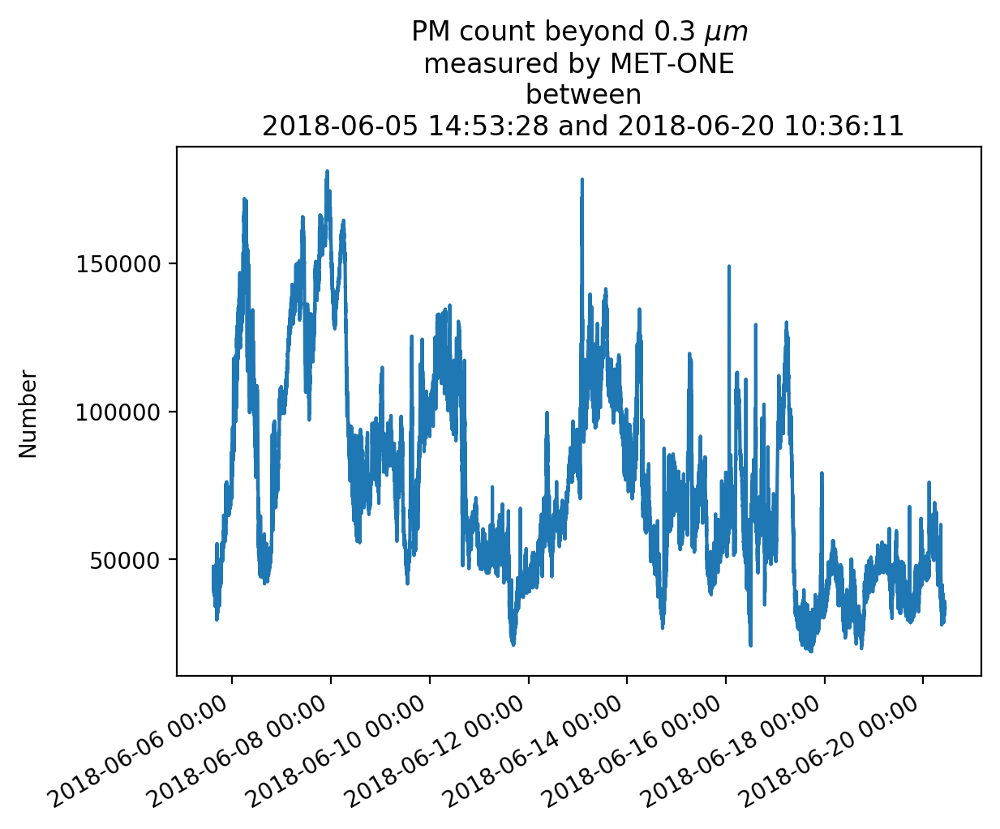

In [30]:
import matplotlib.pyplot as plt
import matplotlib.dates as md

%config InlineBackend.figure_format = 'retina'
# %matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots()

ax.plot(df_metOne['Time'], df_metOne['Count1'])
# Tell matplotlib to interpret the x-axis values as dates
ax.xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis_date()
# ax.legend(('PM 1', 'PM 2.5'),loc='upper right')
plt.title('PM count beyond 0.3 ' + r'$\mu m$' + '\n' + 'measured by MET-ONE\n between\n ' + df_metOne['Time'][0].strftime(fmt) + ' and '+ df_metOne['Time'][len(df_metOne)-1].strftime(fmt))
ax.set_ylabel('Number',labelpad=16)

# Make space for and rotate the x-axis tick labels
fig.autofmt_xdate()
plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['font.size'] = 16
plt.show();

In [31]:
# average per 5 minutes (label-right means the time I see represents the end of the mean)
df_metOne_5min = df_metOne.resample('5T', label='right',on='Time').mean()

In [32]:
# X - now take rows between 7.6.2018 18:30 and 16.6.2018 18:00
# V - now take rows between 10.6.2018 07:30 and 19.6.2018 07:00
mask = (df_metOne_5min.index < "2018-06-10 07:30") | (df_metOne_5min.index > "2018-06-19 07:00")
df_metOne_5min.drop(df_metOne_5min.loc[mask,:].index, inplace=True)


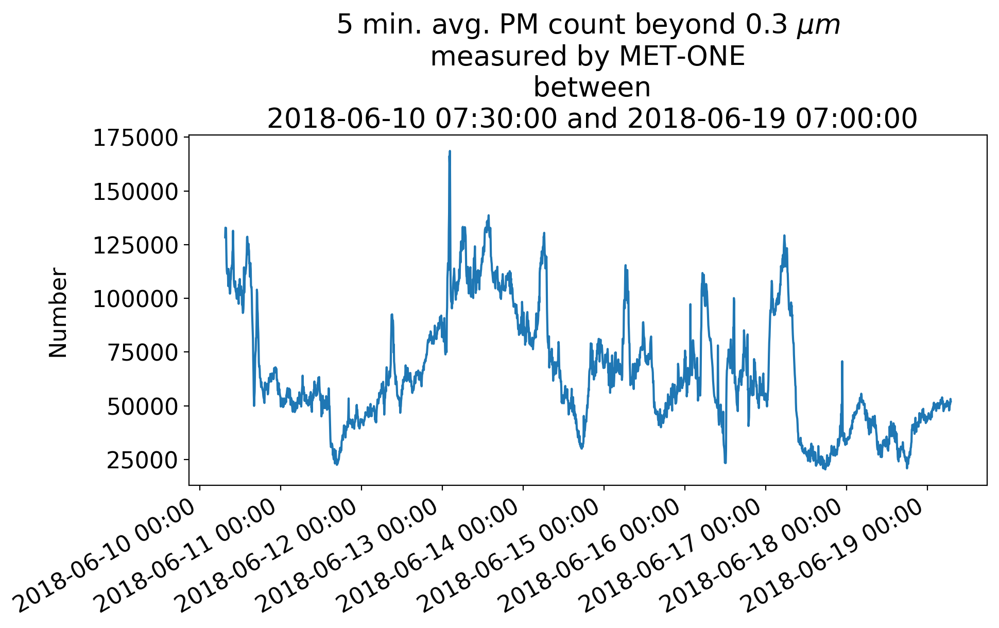

In [33]:
fig, ax = plt.subplots()

ax.plot(df_metOne_5min.index, df_metOne_5min['Count1'])
# Tell matplotlib to interpret the x-axis values as dates
ax.xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis_date()
# ax.legend(('PM 1', 'PM 2.5'),loc='upper right')
plt.title('5 min. avg. PM count beyond 0.3 ' + r'$\mu m$' + '\n' + 'measured by MET-ONE\n between\n ' + df_metOne_5min.index[0].strftime(fmt) + ' and '+ df_metOne_5min.index[len(df_metOne_5min)-1].strftime(fmt))
ax.set_ylabel('Number',labelpad=16)

# Make space for and rotate the x-axis tick labels
fig.autofmt_xdate()
plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['font.size'] = 16
plt.show();

In [34]:
# now the index of df_metOne_5min is Time
df_metOne_5min.head()
df_metOne_5min.tail()

,Size1,Count1,Size2,Count2,Size3,Count3,Size4,Count4
Time,,,,,,,,
2018-06-10 07:30:00,0.3,128393.4,0.5,14474.2,1.0,4497.8,2.5,1015.8
2018-06-10 07:35:00,0.3,132899.8,0.5,14649.2,1.0,4507.4,2.5,1016.8
2018-06-10 07:40:00,0.3,132787.6,0.5,14504.0,1.0,4473.0,2.5,1045.6
2018-06-10 07:45:00,0.3,132760.8,0.5,14501.2,1.0,4453.0,2.5,1023.6
2018-06-10 07:50:00,0.3,123389.8,0.5,13653.0,1.0,4303.6,2.5,954.8


,Size1,Count1,Size2,Count2,Size3,Count3,Size4,Count4
Time,,,,,,,,
2018-06-19 06:40:00,0.3,49926.6,0.5,3985.6,1.0,1313.4,2.5,339.0
2018-06-19 06:45:00,0.3,50922.4,0.5,3987.6,1.0,1292.6,2.5,336.4
2018-06-19 06:50:00,0.3,50902.2,0.5,3934.8,1.0,1284.6,2.5,334.8
2018-06-19 06:55:00,0.3,53193.6,0.5,4226.4,1.0,1350.0,2.5,353.2
2018-06-19 07:00:00,0.3,52023.8,0.5,4355.2,1.0,1440.6,2.5,387.2


In [35]:
df_metOne_5min.drop(df_metOne_5min.head(1).index, inplace=True)

In [36]:
df_metOne_5min.head()

,Size1,Count1,Size2,Count2,Size3,Count3,Size4,Count4
Time,,,,,,,,
2018-06-10 07:35:00,0.3,132899.8,0.5,14649.2,1.0,4507.4,2.5,1016.8
2018-06-10 07:40:00,0.3,132787.6,0.5,14504.0,1.0,4473.0,2.5,1045.6
2018-06-10 07:45:00,0.3,132760.8,0.5,14501.2,1.0,4453.0,2.5,1023.6
2018-06-10 07:50:00,0.3,123389.8,0.5,13653.0,1.0,4303.6,2.5,954.8
2018-06-10 07:55:00,0.3,116338.6,0.5,12743.0,1.0,4128.4,2.5,885.4


## Sensors data

In [37]:
import datetime
import os

def getData(path, sensor, start, end, output_no, vector): 
    #getTimes
    fmt = "%Y-%m-%d %H_%M_%S"
    logPath = path+str(sensor)
    file_names = np.array(os.listdir(logPath))
    ind = []
    for i, file in enumerate(file_names):
        if len(file) != 27:
            ind.append(i)
    file_names = np.delete(file_names, ind)

    # extract times from file names
    times_str = np.array([ind[4:-4] for ind in file_names])
    # convert to datetime
    times_datetime = np.array([datetime.datetime.strptime(times_str[x], fmt) for x in range(len(times_str))])
    # choose the times between start and end
    times_chosen = times_datetime[(times_datetime >= start) & (times_datetime <= end)]
    # choose the relevant logs
    times_log = np.array(['log_' + x.strftime(fmt)+'.txt' for x in times_chosen])
    #getSignalData
    # extract all data from chosen logs
    all_data = []
    for i in range(len(times_log)):
        data = np.zeros((duration, output_no), dtype=float)
        filename = path + str(sensor) + '/' + times_log[i]
        with open(filename, 'r') as f:
            lines = f.read().splitlines()
            data[:] = [lines[x] for x in vector]
        f.close()
        all_data.append(data)
    return np.concatenate(all_data, axis=0), times_chosen

In [38]:
dataPath = '/Users/iditbela/Documents/Sensors_Barak_lab/data_analysis/ZoeysData/SensorsDataAtzmaut/'
# These timesteps are wrong. the more accurate ones are 10/6 07:30 and 19/6 07:00
start_date = datetime.datetime(2018, 6, 7, 18, 30, 0)
end_date = datetime.datetime(2018, 6, 16, 18, 0, 0)
duration = 1 # measurement duration. it's 5 minutes average and in each file 1 value

## sensor-1-SDS021

In [39]:
sensor_no = 1
vector = [0,4] # the relevant lines in the txt files
output_no = len(vector)

data_1, times_1 = getData(dataPath, sensor_no, start_date, end_date, output_no, vector)

In [40]:
# change data to dataframe
df_sensor_1 = pd.DataFrame(data = np.concatenate((times_1.reshape(-1,1),data_1),axis=1),
                           columns = ['date','PM2.5','PM10'])

In [41]:
df_sensor_1.date = pd.to_datetime(df_sensor_1.date, errors='coerce')
sensor_1_col = df_sensor_1.columns
for i in range(1,len(sensor_1_col)):
    df_sensor_1[sensor_1_col[i]] = pd.to_numeric(df_sensor_1[sensor_1_col[i]], errors='coerce')

In [42]:
df_sensor_1.head()
df_sensor_1.tail()

,date,PM2.5,PM10
0,2018-06-07 18:30:29,21.411371,29.558528
1,2018-06-07 18:35:30,22.197324,28.290970
2,2018-06-07 18:40:31,22.323333,32.070000
3,2018-06-07 18:45:32,20.040134,24.782609
4,2018-06-07 18:50:33,20.963211,28.575251


,date,PM2.5,PM10
2576,2018-06-16 17:37:57,8.788591,13.677852
2577,2018-06-16 17:42:58,9.020000,13.900000
2578,2018-06-16 17:47:59,8.142361,15.003472
2579,2018-06-16 17:53:00,7.614865,13.679054
2580,2018-06-16 17:58:01,8.177474,15.088737


In [43]:
df_sensor_1_resemp = df_sensor_1.resample('5T', label='right',on='date').mean()

## Data available in Atzmaut station

### 3. Low-cost sensor NovaFit SDS021

In [44]:
df_sensor_1_resemp.head()
df_sensor_1_resemp.tail()

,PM2.5,PM10
date,,
2018-06-07 18:35:00,21.411371,29.558528
2018-06-07 18:40:00,22.197324,28.290970
2018-06-07 18:45:00,22.323333,32.070000
2018-06-07 18:50:00,20.040134,24.782609
2018-06-07 18:55:00,20.963211,28.575251


,PM2.5,PM10
date,,
2018-06-16 17:40:00,8.788591,13.677852
2018-06-16 17:45:00,9.020000,13.900000
2018-06-16 17:50:00,8.142361,15.003472
2018-06-16 17:55:00,7.614865,13.679054
2018-06-16 18:00:00,8.177474,15.088737


In [45]:
# shift time in 3 days minus 11 hours
df_sensor_1_resemp.index = pd.date_range(start='2018-06-10 07:35:00',end='2018-06-19 07:00:00',freq='5min')
df_sensor_1_resemp.index.rename('date', inplace=True)

## sensor-2-PMS5003

In [46]:
sensor_no = 2
vector = [0,4,8,12,16,20,24,28,32,36] # relevant rows
output_no = len(vector)

data_2, times_2 = getData(dataPath, sensor_no, start_date, end_date, output_no, vector)

In [47]:
# change data to dataframe
df_sensor_2 = pd.DataFrame(data = np.concatenate((times_2.reshape(-1,1),data_2),axis=1),
                           columns = ['date','PM1','PM2.5','PM10','PM1atm','PM2.5atm','PM10atm','0.3count','0.5count',
                                      '1count','2.5count'])


In [48]:
df_sensor_2.head()
df_sensor_2.tail()

,date,PM1,PM2.5,PM10,PM1atm,PM2.5atm,PM10atm,0.3count,0.5count,1count,2.5count
0,2018-06-07 18:34:16,30.4067,42.4767,44.5467,25.8133,37.1833,44.1767,5219.39,1546.56,245.477,8.73333
1,2018-06-07 18:39:19,28.8629,39.8495,41.7726,24.6689,35.5686,41.5217,5056.99,1487.09,231,10.087
2,2018-06-07 18:44:21,27.3833,37.5167,39.49,23.7967,34.17,39.49,4861.39,1417.43,220.897,8.62667
3,2018-06-07 18:49:24,27.1706,37.1672,38.3411,23.7625,34.0769,38.3411,4741.7,1402.65,216.378,6.9398
4,2018-06-07 18:54:26,26.4749,35.4114,36.8194,23.4682,33.0635,36.8194,4574.02,1343.2,197.592,7.27425


,date,PM1,PM2.5,PM10,PM1atm,PM2.5atm,PM10atm,0.3count,0.5count,1count,2.5count
2563,2018-06-16 17:39:41,10.6321,14.2441,15.2676,10.6321,14.2441,15.2676,1947.7,574.749,81.8395,2.92308
2564,2018-06-16 17:44:43,10.2742,13.0435,13.6154,10.2742,13.0435,13.6154,1840.86,540.147,68.8328,1.80936
2565,2018-06-16 17:49:45,10.0033,13.2642,13.6154,10.0033,13.2642,13.6154,1838.16,534.726,76.0569,2.28094
2566,2018-06-16 17:54:47,9.68896,13.1472,13.5318,9.68896,13.1472,13.5318,1843.83,540.766,82.3512,2.13378
2567,2018-06-16 17:59:49,9.81333,12.88,13.44,9.81333,12.88,13.44,1881.71,551.743,73.4233,2.48


In [49]:
df_sensor_2.date = pd.to_datetime(df_sensor_2.date, errors='coerce')
sensor_2_col = df_sensor_2.columns
for i in range(1,len(sensor_2_col)):
    df_sensor_2[sensor_2_col[i]] = pd.to_numeric(df_sensor_2[sensor_2_col[i]], errors='coerce')

In [50]:
df_sensor_2_resemp = df_sensor_2.resample('5T', label='right',on='date').mean()

## Data available in Atzmaut station

### 4. Low-cost sensor Plantower PMS5003

In [51]:
df_sensor_2_resemp.head()
df_sensor_2_resemp.tail()

,PM1,PM2.5,PM10,PM1atm,PM2.5atm,PM10atm,0.3count,0.5count,1count,2.5count
date,,,,,,,,,,
2018-06-07 18:35:00,30.406667,42.476667,44.546667,25.813333,37.183333,44.176667,5219.390000,1546.556667,245.476667,8.733333
2018-06-07 18:40:00,28.862876,39.849498,41.772575,24.668896,35.568562,41.521739,5056.986622,1487.090301,231.000000,10.086957
2018-06-07 18:45:00,27.383333,37.516667,39.490000,23.796667,34.170000,39.490000,4861.390000,1417.426667,220.896667,8.626667
2018-06-07 18:50:00,27.170569,37.167224,38.341137,23.762542,34.076923,38.341137,4741.695652,1402.652174,216.377926,6.939799
2018-06-07 18:55:00,26.474916,35.411371,36.819398,23.468227,33.063545,36.819398,4574.016722,1343.200669,197.591973,7.274247


,PM1,PM2.5,PM10,PM1atm,PM2.5atm,PM10atm,0.3count,0.5count,1count,2.5count
date,,,,,,,,,,
2018-06-16 17:40:00,10.632107,14.244147,15.267559,10.632107,14.244147,15.267559,1947.702341,574.749164,81.839465,2.923077
2018-06-16 17:45:00,10.274247,13.043478,13.615385,10.274247,13.043478,13.615385,1840.856187,540.147157,68.832776,1.809365
2018-06-16 17:50:00,10.003344,13.264214,13.615385,10.003344,13.264214,13.615385,1838.157191,534.725753,76.056856,2.280936
2018-06-16 17:55:00,9.688963,13.147157,13.531773,9.688963,13.147157,13.531773,1843.826087,540.765886,82.351171,2.133779
2018-06-16 18:00:00,9.813333,12.880000,13.440000,9.813333,12.880000,13.440000,1881.710000,551.743333,73.423333,2.480000


In [52]:
# shift time in 3 days
df_sensor_2_resemp.index = pd.date_range(start='2018-06-10 07:35:00',end='2018-06-19 07:00:00',freq='5min')
df_sensor_2_resemp.index.rename('date', inplace=True)

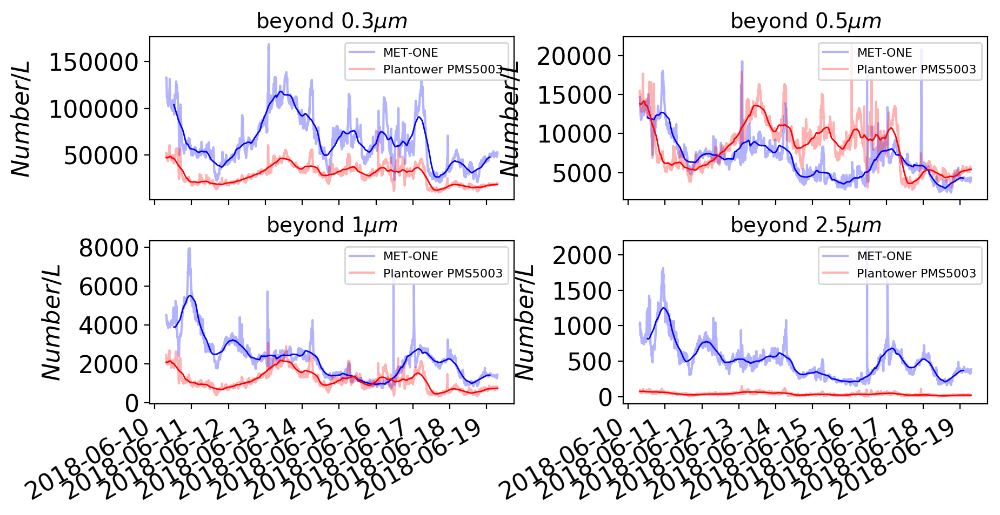

In [53]:
# compare number of particles MET-ONE (df_metOne_5min) and PMS5003 (df_sensor_2) - basic lines in time

# plot signal SENSOR-2-PMS5003
%config InlineBackend.figure_format = 'retina'
# plt.style.use('default')

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots(nrows=2, ncols=2)
fig.subplots_adjust(hspace=0.25, wspace=0.3)
col_met = df_metOne_5min.columns[1::2]
col_sensor = df_sensor_2.columns[7:]
tit = ['beyond 0.3' + r'$\mu m$','beyond 0.5' + r'$\mu m$','beyond 1' + r'$\mu m$','beyond 2.5' + r'$\mu m$']
c = 0
shift_periods = 0 # One hour shift I suspect

for i in range(2):
    for j in range(2):
        ax[i,j].plot(df_metOne_5min.index, df_metOne_5min[col_met[c]].shift(periods=shift_periods),'b',alpha = 0.3)
        ax[i,j].plot(df_sensor_2_resemp.index, df_sensor_2_resemp[col_sensor[c]]*10,'r',alpha = 0.3) #because its in 0.1L
        
        # add moving average of 120 values (10 hours)
        # Look at the signal of counts with np.convolve or pd.rolling(moving average)
        ax[i,j].plot(df_metOne_5min.index, df_metOne_5min[col_met[c]].shift(periods=shift_periods).rolling(window=120, center=True).mean(),'b',linewidth=1,linestyle='solid')
        ax[i,j].plot(df_sensor_2_resemp.index, 10*df_sensor_2_resemp[col_sensor[c]].rolling(window=120, center=True, min_periods=1).mean(),'r',linestyle='solid',linewidth=1) #because its in 0.1L
        
        ax[i,j].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
        ax[i,j].legend(('MET-ONE','Plantower PMS5003'),loc='upper right',fontsize = 8)
        ax[i,j].set_ylabel(r'$Number/L$',labelpad=9)
        ax[i,j].set_title(tit[c],fontsize = 14)
#         ax[i,j].grid(1,which='both')
        c += 1

plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['font.size'] = 10
fig.autofmt_xdate()
# plt.savefig('Fig1.png', format='png', dpi=1000)
plt.show();



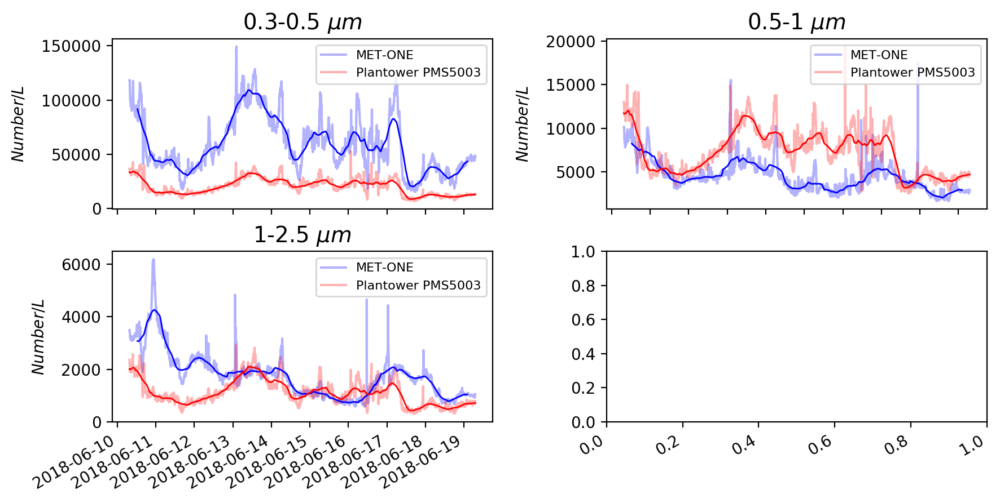

In [86]:
# substract signal

# compare number of particles MET-ONE (df_metOne_5min) and PMS5003 (df_sensor_2) - basic lines in time

# plot signal SENSOR-2-PMS5003
%config InlineBackend.figure_format = 'retina'
# plt.style.use('default')

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots(nrows=2, ncols=2)
fig.subplots_adjust(hspace=0.25, wspace=0.3)
col_met = df_metOne_5min.columns[1::2]
col_sensor = df_sensor_2.columns[7:]
tit = ['0.3-0.5 ' + r'$\mu m$','0.5-1 ' + r'$\mu m$','1-2.5 ' + r'$\mu m$']
c = 0
shift_periods = 0 # One hour shift I suspect

for i in range(2):
    for j in range(2):
        if i==1 and j==1:
            continue
        ax[i,j].plot(df_metOne_5min.index, df_metOne_5min[col_met[c]]-df_metOne_5min[col_met[c+1]],'b',alpha = 0.3)
        ax[i,j].plot(df_sensor_2_resemp.index, df_sensor_2_resemp[col_sensor[c]]*10-df_sensor_2_resemp[col_sensor[c+1]]*10,'r',alpha = 0.3) #because its in 0.1L
        
        # add moving average of 120 values (10 hours)
        # Look at the signal of counts with np.convolve or pd.rolling(moving average)
        ax[i,j].plot(df_metOne_5min.index, (df_metOne_5min[col_met[c]]-df_metOne_5min[col_met[c+1]]).rolling(window=120, center=True).mean(),'b',linewidth=1,linestyle='solid')
        ax[i,j].plot(df_sensor_2_resemp.index, (df_sensor_2_resemp[col_sensor[c]]*10-df_sensor_2_resemp[col_sensor[c+1]]*10).rolling(window=120, center=True, min_periods=1).mean(),'r',linestyle='solid',linewidth=1) #because its in 0.1L
        
        ax[i,j].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
        ax[i,j].legend(('MET-ONE','Plantower PMS5003'),loc='upper right',fontsize = 8)
        ax[i,j].set_ylabel(r'$Number/L$',labelpad=9)
        ax[i,j].set_title(tit[c],fontsize = 14)
#         ax[i,j].grid(1,which='both')
        c += 1

plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['font.size'] = 10
fig.autofmt_xdate()
# plt.savefig('Fig1_b.png', format='png', dpi=1000)
plt.show();

In [54]:
t = ['PM 2.5','PM 10']

# the equivalence of np.corrcoef(data_1[:,i-1], data_2[:,i])
# normalized cross-correlation 
def pearson(a, b):
    # Length.
    n = len(a)
    # Means.
    ma = sum(a) / n
    mb = sum(b) / n
    # Shifted samples.
    _ama = a - ma
    _bmb = b - mb
    # Standard deviations.
    sa = np.sqrt(np.dot(_ama, _ama) / n)
    sb = np.sqrt(np.dot(_bmb, _bmb) / n)
    # Covariation.
    cov = np.dot(_ama, _bmb) / n
    # Final formula.
    # Note: division by `n` in deviations and covariation cancel out each other in
    #       final formula and could be ignored.
    return cov / (sa * sb)

# the equivalence of plt.xcorr(data_1[:,i-1], data_2[:,i],normed=True, maxlags=1) #maxlags=1 is zero lag
# not normalized cross-correlation
def cross0lag(a, b):
    return np.dot(a, b) / np.sqrt(np.dot(a, a) * np.dot(b, b))

In [55]:
from scipy import stats
# calculate cross-correlation 
# https://anomaly.io/understand-auto-cross-correlation-normalized-shift/
shift_periods = 0
for i in range(4):
#     for j in range(1,5):
#         a=df_metOne_5min[col_met[i]][1:-j]
#         b=df_sensor_2_resemp[col_sensor[i]][j:]*10
    a=df_metOne_5min[col_met[i]].shift(periods=shift_periods)#.rolling(window=120, center=True).mean()
    b=10*df_sensor_2_resemp[col_sensor[i]]#.rolling(window=120, center=True).mean()
    mask_ab = ~np.isnan(a) & ~np.isnan(b) 
#         pearson = normalized cross correlation. I think more indecative
#     print('corr_coeff ' + col_met[i] + ' ' + str(np.corrcoef(a[mask_ab],b[mask_ab])[0,1]))
    print('pearson_coeff ' + col_met[i] + ' ' + str(pearson(a[mask_ab],b[mask_ab])))
#     print('kendall tau ' + col_met[i] + ' ' + str(stats.kendalltau(a[mask_ab],b[mask_ab])) + ' \n')
    
#     print('xcorr ' + col_met[i] + ' ' + str(np.max(plt.xcorr(a[mask_ab],b[mask_ab],normed=True, maxlags=1000)[1]))) # looking if there exist a lag
#     print('cross_coeff ' + col_met[i] + ' ' + str(cross0lag(a[mask_ab],b[mask_ab])) + ' \n')

pearson_coeff Count1 0.9009627340007027
pearson_coeff Count2 0.3912944239103993
pearson_coeff Count3 0.27167438328168775
pearson_coeff Count4 0.5618644784098187


In [90]:
from scipy import stats
# calculate cross-correlation 
# https://anomaly.io/understand-auto-cross-correlation-normalized-shift/
shift_periods = 0
for c in range(3):
#     for j in range(1,5):
#         a=df_metOne_5min[col_met[i]][1:-j]
#         b=df_sensor_2_resemp[col_sensor[i]][j:]*10
    a=df_metOne_5min[col_met[c]]-df_metOne_5min[col_met[c+1]]
    b=df_sensor_2_resemp[col_sensor[c]]*10-df_sensor_2_resemp[col_sensor[c+1]]*10
    mask_ab = ~np.isnan(a) & ~np.isnan(b) 
#         pearson = normalized cross correlation. I think more indecative
#     print('corr_coeff ' + col_met[i] + ' ' + str(np.corrcoef(a[mask_ab],b[mask_ab])[0,1]))
    print('pearson_coeff ' + col_met[i] + ' ' + str(pearson(a[mask_ab],b[mask_ab])))
#     print('kendall tau ' + col_met[i] + ' ' + str(stats.kendalltau(a[mask_ab],b[mask_ab])) + ' \n')
    
#     print('xcorr ' + col_met[i] + ' ' + str(np.max(plt.xcorr(a[mask_ab],b[mask_ab],normed=True, maxlags=1000)[1]))) # looking if there exist a lag
#     print('cross_coeff ' + col_met[i] + ' ' + str(cross0lag(a[mask_ab],b[mask_ab])) + ' \n')

pearson_coeff Count1 0.9043984041121559
pearson_coeff Count1 0.5111070614967484
pearson_coeff Count1 0.2622224616674528


In [56]:
# # see the correlation with resampling
# col_met = df_metOne_5min.columns[1::2]
# col_sensor = df_sensor_2.columns[7:]
# c = 0
# window = ['10T','15T','20T','30T','H','2H','3H','4H','5H','6H','12H','24H']

# df_window = pd.DataFrame(index=np.arange(0,len(col_met)*len(window)),
#                          columns=['window','count','correlation'])
# ind = 0
# for w in window:
#     for c in range(len(col_met)):
       
#         df_sensor_2_resemp['date'] = df_sensor_2_resemp.index
#         a=df_sensor_2_resemp.resample('5T', label='right',on='date').mean()

#         df_metOne_5min['Time'] = df_metOne_5min.index
#         b=df_metOne_5min.resample('5T', label='right',on='Time').mean()
        
#         temp_a=10*a[col_sensor[c]] #sensor
#         temp_b=b[col_met[c]] #metOne
#         mask_ab = ~np.isnan(temp_a) & ~np.isnan(temp_b) 
     
#         df_window.iloc[ind] = [w,col_sensor[c],stats.pearsonr(temp_a[mask_ab],temp_b[mask_ab])[0]] 
#         ind += 1

In [57]:
# df_window.set_index('window', inplace=True)

In [58]:
# df_window.tail()

In [59]:
# # see correlation with increasing moving average

# %config InlineBackend.figure_format = 'retina'
# [ax1, ax2, ax3, ax4] = df_window.groupby('count')['correlation'].plot(legend=True)
# ax1.set_ylabel('Correlation')
# ax1.set_title('Correlation between Plantower PMS5003\n and MET-ONE signal \n with increasing average window')
# ax1.set_xlabel('\n average window [h]')
# # ax1.set_xticks(np.arange(0,24*12,12))
# # ax1.set_xticklabels(np.arange(0,24))
# ax1.grid(1,which='both')
# plt.show();

In [60]:
# convert MET-ONE number of particles to mass: 
# asumming rho = 2.65 g/cm^3 
# r = np.array([0.3,0.5,1,2.5])/2 #[micro meter]
r = np.array([0.4,0.75,1.75,2.5])/2 #[micro meter] #maybe r is average in the middle?
V = 4*np.pi*r**3 / 3 #[(micro meter)^3]
rho = 2650000 #[g/m^3] 
m = rho*V*(10**-6)**3  #mass [grams] of one particle
# convert to mass of all particles in 1-L by factor:
factors = m*(10**6)*(10**3)
# multiplying number of measured particles (N) by this factor will result in PM concentration
# in units of micro-gram/m^3

# 1000 cm^3 = 1L = 0.001 m^3
# 100 cm^3 = 0.1L = 0.0001 m^3
# 5 particles in 1 L equals 5*10^3 particles in m^3

factors
above25 = df_metOne_5min['Count4'] #number of particles greater than 2.5 micro-meter
between1_25 = df_metOne_5min['Count3']-df_metOne_5min['Count4'] #number of particles greater than 1 micro-meter and smaller than 2.5
between05_1 = df_metOne_5min['Count2']-df_metOne_5min['Count3'] #number of particles greater than 0.5 micro-meter and smaller than 1
between03_05 = df_metOne_5min['Count1']-df_metOne_5min['Count2'] #number of particles greater than 0.3 micro-meter and smaller than 0.5

#pm2.5
# Mass of all particles smaller than 2.5 diameter  
mass_25 = between03_05*factors[0] + between05_1*factors[1] + between1_25*factors[2]
#pm1
# Mass of all particles smaller than 1 diameter 
mass_1 = between03_05*factors[0] + between05_1*factors[1]



array([8.88023523e-05, 5.85367069e-04, 7.43632980e-03, 2.16802618e-02])

number of particles - No of all particles greater than X diameter [micro-meter]
mass concentration - Mass of all particles smaller than X diameter [micro-meter]

In [61]:
# #sensor1
# df_sensor_1_resemp.head(1)
# #sensor2
# df_sensor_2_resemp.head(1)
# #MET-ONE
# df_metOne_5min.head(1)
# #AQM
# df_AQM.head(1)
# # and COUNT

In [62]:

# def plotTimeSeries(rows,cols,x_data,y_data,shift_periods):
#     #col_names - array n X No.signals, #x_data = list, y_data = dataframe with all signals
#     %config InlineBackend.figure_format = 'retina'
#     # plt.style.use('ggplot')

#     fmt = "%Y-%m-%d %H:%M:%S"
#     fig, ax = plt.subplots(nrows=rows, ncols=cols)
#     fig.subplots_adjust(hspace=0.25, wspace=0.3)
# #     tit = ['beyond 0.3' + r'$\mu m$','beyond 0.5' + r'$\mu m$','beyond 1' + r'$\mu m$','beyond 2.5' + r'$\mu m$']
#     c=0
#     for i in range(rows): #number of plots
#         for j in range(cols): #number of signals in each plot

#             ax[i,j].plot(x_data[0], pd.DataFrame(y_data[0][:,c]).shift(periods=shift_periods),'r',alpha = 0.3)
#             ax[i,j].plot(x_data[0],pd.DataFrame(y_data[0][:,c]).shift(periods=shift_periods).
#                          rolling(window=120, center=True).mean(),'r',linewidth=1,linestyle='solid')

#             ax[i,j].plot(x_data[1], y_data[1][:,c]*10,'b',alpha = 0.3) #because its in 0.1L
#             ax[i,j].plot(x_data[1], 10*pd.DataFrame(y_data[1][:,c]).
#                          rolling(window=120, center=True, min_periods=1).mean(),'b',linestyle='solid',linewidth=1) #because its in 0.1L
#             c += 1
# #                 ax[i,j].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
# #                 ax[i,j].legend(('MET-ONE','Plantower PMS5003'),loc='upper right',fontsize = 8)
# #                 ax[i,j].set_ylabel('No. of particles in L',labelpad=9)
# #                 ax[i,j].set_title(tit[c],fontsize = 14)

#     plt.rcParams['figure.figsize'] = (10, 5)
#     plt.rcParams['font.size'] = 10
#     fig.autofmt_xdate()
#     plt.show();



In [63]:
# shift_periods = 200
# rows = 2
# cols = 2
# col_names = np.array([df_metOne_5min.columns[1::2].values,df_sensor_2.columns[7:].values])
# x_data = np.array([df_metOne_5min.index,df_sensor_2_resemp.index])
# # find out why I can't just hand in the col_names.... ;/
# y_data = np.array([df_metOne_5min[col_names[0]].values,
#           df_sensor_2_resemp[col_names[1]].values])

# plotTimeSeries(rows,cols,x_data,y_data,shift_periods)

In [64]:
def plotTimeSeries(ax,i,j,x_data,y_data,color,shift_periods):
#    y_data should be a dataframe
    ax[i,j].plot(x_data, y_data.shift(periods=shift_periods), color, alpha = 0.3)
    ax[i,j].plot(x_data,y_data.shift(periods=shift_periods).
                 rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid')
#     plt.rcParams['figure.figsize'] = (10, 5)
#     plt.rcParams['font.size'] = 10
#     fig.autofmt_xdate()
#     plt.show();


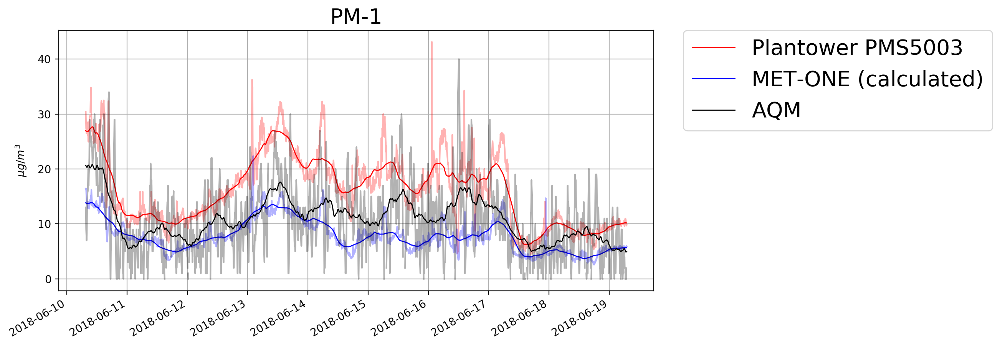

In [65]:
%config InlineBackend.figure_format = 'retina'
# plt.style.use('default')
fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots()
# fig.subplots_adjust(hspace=0.1, wspace=0.1)

# WHY ISNT IT WORKING LIKE THIS ?
# plotTimeSeries(ax[1,0],df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'r',0)
# plotTimeSeries(ax,0,0,df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'b',200)


# IMPLEMENTING IT THE UGLY WAY UNTIL I UNDERSTAND THE PROBLEM

# --------- PM1 -----------
#sensor2
shift_periods=0
color = 'r'
ax.plot(df_sensor_2_resemp.index, df_sensor_2_resemp['PM1'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='Plantower PMS5003')
ax.set_ylabel(r'$\mu g/m^3$',labelpad=9)

#MET-ONE (using factors,mass_1)
shift_periods=0
color = 'b'
ax.plot(df_metOne_5min.index, mass_1.shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_metOne_5min.index,mass_1.shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='MET-ONE (calculated)')

#AQM
shift_periods=0
color = 'k'
ax.plot(df_AQM.date, df_AQM['PM1'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_AQM.date,df_AQM['PM1'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='AQM')

ax.set_title('PM-1',fontsize = 20)
lgd = ax.legend(bbox_to_anchor=(1.05, 1),loc=2,fontsize = 20,borderaxespad=0.)

# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 20
fig.autofmt_xdate()
ax.grid(1,which='both')
# fig.savefig('Fig2.png', bbox_extra_artists=(lgd,), bbox_inches='tight',format='png', dpi=500)
plt.show();

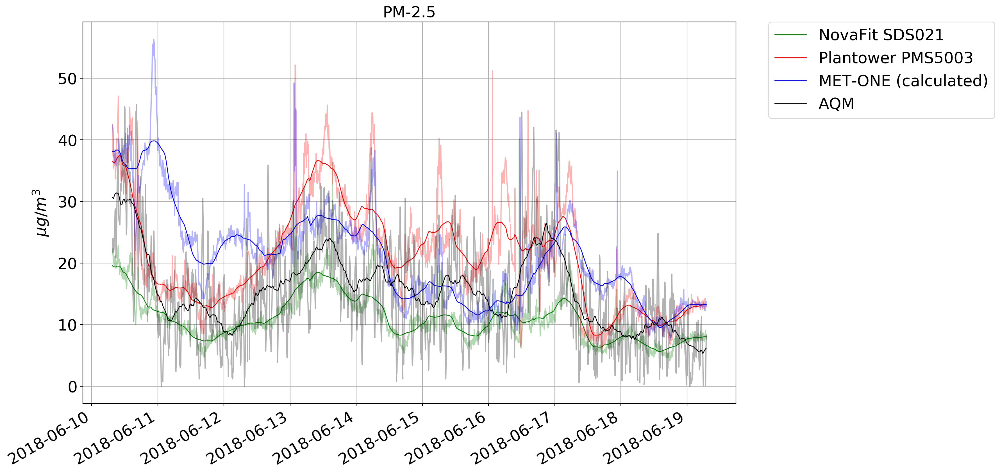

In [66]:
fig, ax = plt.subplots()
# --------- PM2.5 -----------
# plotTimeSeries(ax,0,1,df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'r',100)
#sensor1
shift_periods=0
color = 'g'
ax.plot(df_sensor_1_resemp.index, df_sensor_1_resemp['PM2.5'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_sensor_1_resemp.index,df_sensor_1_resemp['PM2.5'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='NovaFit SDS021')
ax.set_ylabel(r'$\mu g/m^3$',labelpad=9)

#sensor2
shift_periods=0
color = 'r'
ax.plot(df_sensor_2_resemp.index, df_sensor_2_resemp['PM2.5'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_sensor_2_resemp.index,df_sensor_2_resemp['PM2.5'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='Plantower PMS5003')

#MET-ONE(using factors,mass_25)
shift_periods=0
color = 'b'
ax.plot(df_metOne_5min.index, mass_25.shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_metOne_5min.index,mass_25.shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='MET-ONE (calculated)')

#AQM
shift_periods=0
color = 'k'
ax.plot(df_AQM.date, df_AQM['PM2.5'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_AQM.date,df_AQM['PM2.5'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='AQM')

ax.set_title('PM-2.5',fontsize = 20)
lgd = ax.legend(bbox_to_anchor=(1.05, 1),loc=2,fontsize = 20,borderaxespad=0.)


# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 20
fig.autofmt_xdate()
ax.grid(1,which='both')
# fig.savefig('Fig3.png', bbox_extra_artists=(lgd,), bbox_inches='tight',format='png', dpi=500)
# fig.savefig('Fig11.png', bbox_extra_artists=(lgd,), bbox_inches='tight',format='png', dpi=500) #without metone
plt.show();

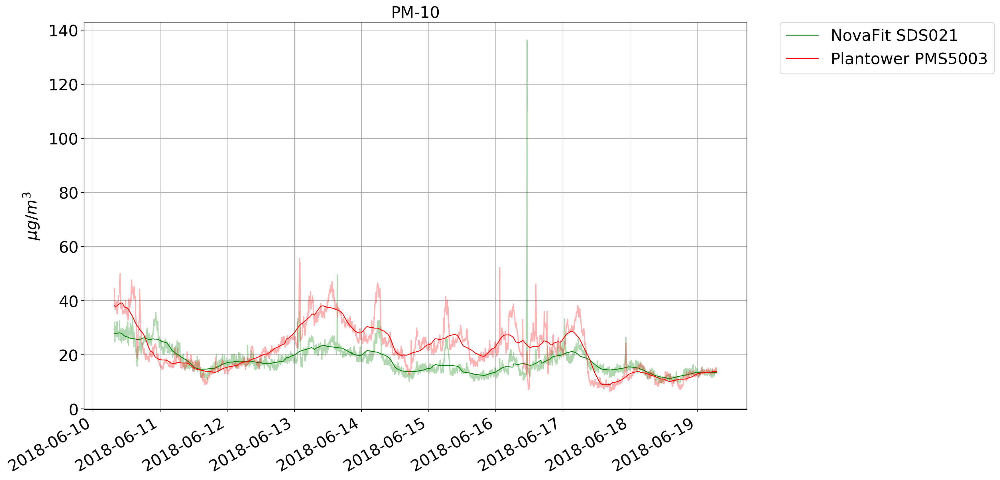

In [67]:
fig, ax = plt.subplots()
# --------- PM10 -----------
#sensor1
shift_periods=0
color = 'g'
ax.plot(df_sensor_1_resemp.index, df_sensor_1_resemp['PM10'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_sensor_1_resemp.index,df_sensor_1_resemp['PM10'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='NovaFit SDS021')
ax.set_ylabel(r'$\mu g/m^3$',labelpad=9)

#sensor2
shift_periods=0
color = 'r'
ax.plot(df_sensor_2_resemp.index, df_sensor_2_resemp['PM10'].shift(periods=shift_periods), color, alpha = 0.3,label='_nolegend_')
ax.plot(df_sensor_2_resemp.index,df_sensor_2_resemp['PM10'].shift(periods=shift_periods).
             rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='Plantower PMS5003')

ax.set_title('PM-10',fontsize = 20)
lgd = ax.legend(bbox_to_anchor=(1.05, 1),loc=2,fontsize = 20,borderaxespad=0.)


# set parameters
plt.rcParams['figure.figsize'] = (10, 15)
plt.rcParams['font.size'] = 20
fig.autofmt_xdate()

# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 20
fig.autofmt_xdate()
ax.grid(1,which='both')
# fig.savefig('Fig4.png', bbox_extra_artists=(lgd,), bbox_inches='tight',format='png', dpi=500)
plt.show();

In [83]:
plt.close('all')
plt.rcParams.update(plt.rcParamsDefault)

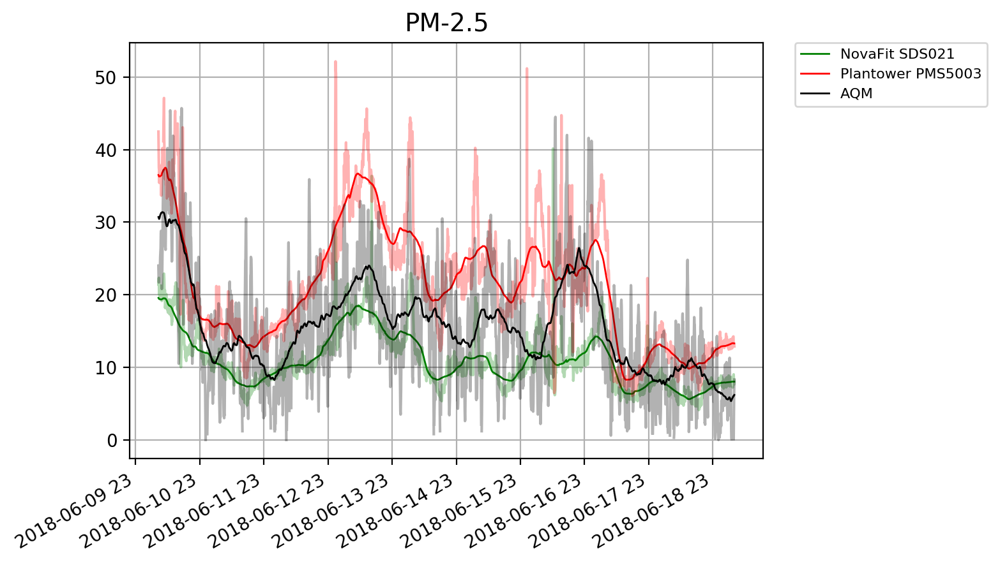

In [69]:
# ONE DAY COMPARISON - see which to shift
%config InlineBackend.figure_format = 'retina'
# plt.style.use('bmh')
fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots()
fig.subplots_adjust(hspace=0.6, wspace=0.)

# WHY ISNT IT WORKING LIKE THIS ?
# plotTimeSeries(ax[1,0],df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'r',0)
# plotTimeSeries(ax,0,0,df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'b',200)


# IMPLEMENTING IT THE UGLY WAY UNTIL I UNDERSTAND THE PROBLEM

def plot_with_trendline(ax, x, y, color, label):
    ax.plot(x, y, color, alpha = .3, label='_nolegend_')
    ax.plot(x, y.rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label=label)


def plot_df_column(ax, df, column, shift, color, label):
    plot_with_trendline(ax, df.index, df[column].shift(periods=shift), color, label)
# --------- PM2.5 -----------
# plotTimeSeries(ax,0,1,df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'r',100)

trs = 0
tre = df_AQM.date.size

#sensor1
plot_df_column(ax, df_sensor_1_resemp[trs:tre], 'PM2.5', 0, 'g', 'NovaFit SDS021')

#sensor2
plot_df_column(ax, df_sensor_2_resemp[trs:tre], 'PM2.5', 0, 'r', 'Plantower PMS5003')

#MET-ONE(using factors,mass_25)
#plot_with_trendline(ax, df_metOne_5min[trs:tre].index, mass_25[trs:tre].shift(periods=0), 'b', 'MET-ONE')

#AQM
plot_with_trendline(ax, df_AQM[trs:tre].date, df['PM2.5'][trs:tre].shift(periods=0), 'k', 'AQM')

ax.set_title('PM-2.5',fontsize = 14)
ax.legend(bbox_to_anchor=(1.05, 1),loc=2,fontsize = 8,borderaxespad=0.)
ax.xaxis.set_major_locator(md.HourLocator(interval=24))
ax.xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d %H"))
# ax[i,j].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
# ax[i,j].legend(('MET-ONE','Plantower PMS5003'),loc='upper right',fontsize = 8)
# ax[i,j].set_ylabel('No. of particles in L',labelpad=9)
# ax[i,j].set_title(tit[c],fontsize = 14)


# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 16
fig.autofmt_xdate()
ax.grid(1,which='both')
plt.show();



In [70]:
# display pearson correlation
def corrfunc(x, y, **kws):
#     r, _ = stats.pearsonr(x, y)
    r = pearson(x, y)
#     r = cross0lag(x, y)  
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.65, .03), xycoords=ax.transAxes)
   

# display line equation
def lineReg(x, y, **kws):
    slope, intercept, _, _, _ = stats.linregress(x,y)
    ax = plt.gca()
    ax.annotate('y={:.2f}*x+{:.2f}'.format(slope,intercept),
                xy=(.03,.9), xycoords=ax.transAxes)    


In [71]:
# scatter_matrix of all PM2.5 data - seaborn pairplot
import seaborn as sns
shift_periods = 0
d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,df_sensor_2_resemp['PM2.5'].values,
                 mass_25.shift(periods=shift_periods).values,df_AQM['PM2.5'].values]))

a = pd.DataFrame(data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])
mask = a.isnull().any(axis = 1)
a.drop(a.loc[mask,:].index, inplace=True) #get ride of the NaNs since it's a problem to plot
a.reset_index(drop=True, inplace=True)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


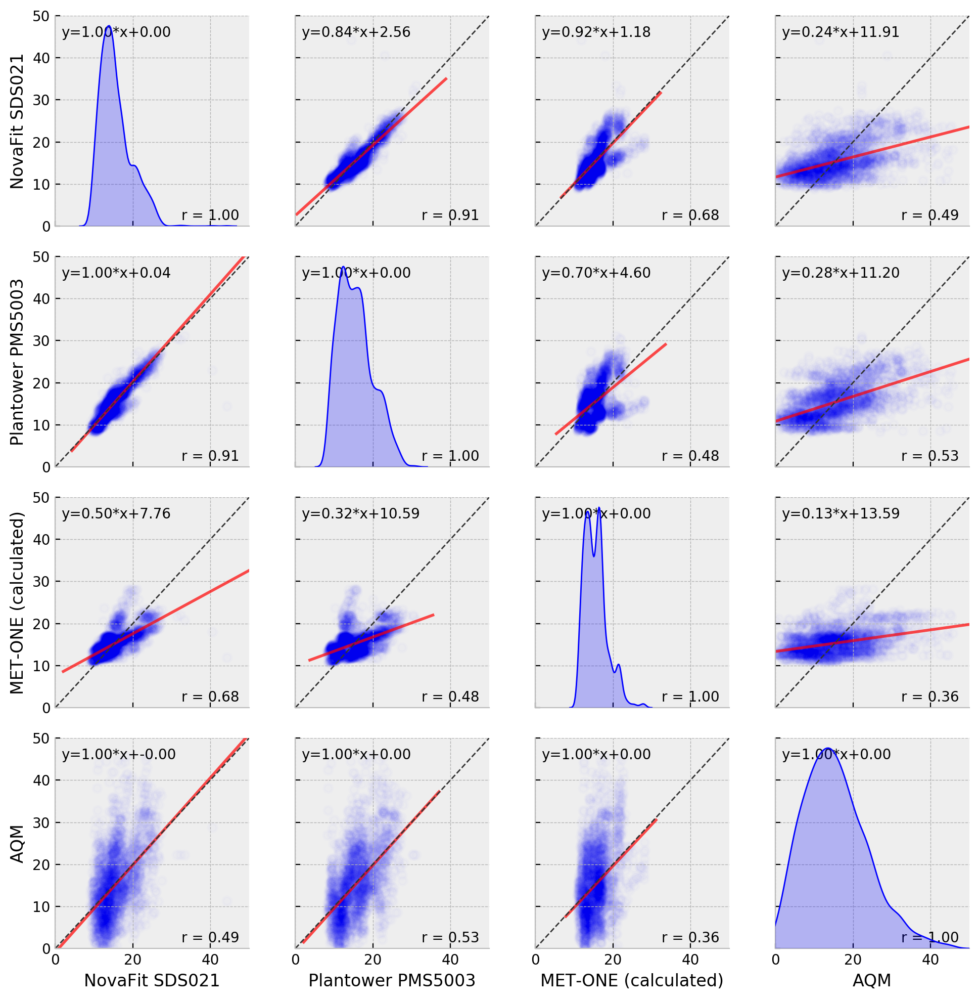

In [76]:
from scipy import stats
%config InlineBackend.figure_format = 'retina'
# plt.style.use('seaborn')
plt.style.use('bmh')
g = sns.pairplot(a, kind="reg",plot_kws={'scatter_kws':{'color':'b','linewidth':2,'alpha':0.01},
                                        'line_kws':{'color':'red','linewidth':2,'alpha':0.7},'robust':True,'ci':None},
                 diag_kws={'color':'b','linewidth':1},diag_kind="kde")
# robusr means it will give smaller weights to outliers
# ci = computational intensive 
 
g.map(corrfunc) 
g.map(lineReg) 

for i,ax in enumerate(g.axes.flat):
    if i in [0,5,10,15]:
        continue
    ax.plot((0, 50), (0, 50), c=".2", ls="--", linewidth=1)
#     ax.set_xlim(0, 50)
#     ax.set_ylim(0,50)
g.set(xlim=(0, 50), ylim=(0, 50));
# g.savefig('Fig5.png',format='png', dpi=500)
plt.show();

In [77]:
plt.close('all')
plt.rcParams.update(plt.rcParamsDefault)

In [78]:
#calibrated
# scatter_matrix of all PM2.5 data - seaborn pairplot
import seaborn as sns
from sklearn.linear_model import LinearRegression


d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,
                           df_sensor_2_resemp['PM2.5'].values,
                 mass_25.shift(periods=shift_periods).values,
                           df_AQM['PM2.5'].values]))

a = pd.DataFrame(data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])


mask = a.isnull().any(axis = 1)
a.drop(a.loc[mask,:].index, inplace=True) #get ride of the NaNs since it's a problem to plot
a.reset_index(drop=True, inplace=True)

reg1m = LinearRegression().fit(a['NovaFit SDS021'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
reg2m = LinearRegression().fit(a['Plantower PMS5003'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
reg3m = LinearRegression().fit(a['MET-ONE (calculated)'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
# reg.coef_,reg.intercept_ 

reg1 = reg1m.predict(a['NovaFit SDS021'].values.reshape(-1,1))
reg2 = reg2m.predict(a['Plantower PMS5003'].values.reshape(-1,1))
reg3 = reg3m.predict(a['MET-ONE (calculated)'].values.reshape(-1,1))

# slope1, intercept1, _, _, _ = stats.linregress(a['AQM'],a['NovaFit SDS021'])
# slope2, intercept2, _, _, _ = stats.linregress(a['AQM'],a['Plantower PMS5003'])
# slope3, intercept3, _, _, _ = stats.linregress(a['AQM'],a['MET-ONE (calculated)'])

a['NovaFit SDS021'] = reg1#(a['NovaFit SDS021']-intercept1)/slope1
a['Plantower PMS5003'] = reg2#(a['Plantower PMS5003']-intercept2)/slope2
a['MET-ONE (calculated)'] = reg3#(a['MET-ONE (calculated)']-intercept3)/slope3
                           

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


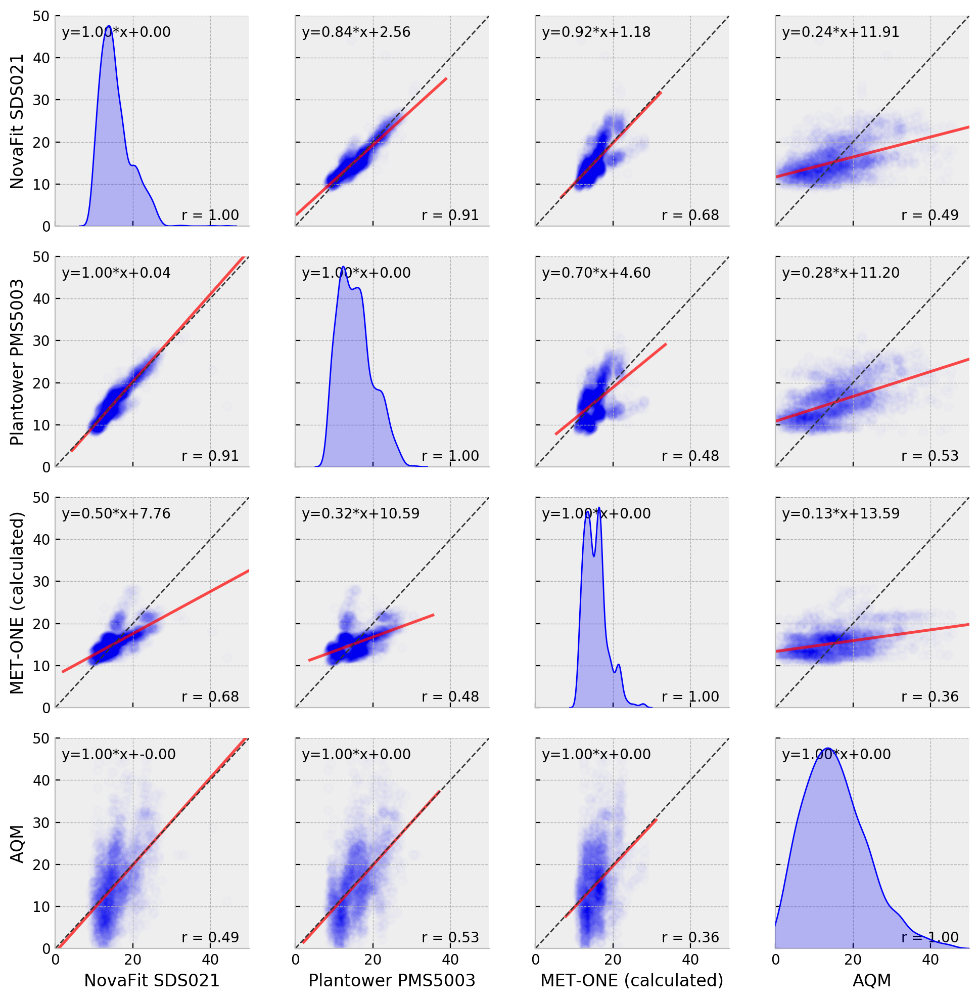

In [80]:
from scipy import stats
%config InlineBackend.figure_format = 'retina'
# plt.style.use('seaborn')
plt.style.use('bmh')
g = sns.pairplot(a, kind="reg",plot_kws={'scatter_kws':{'color':'b','linewidth':2,'alpha':0.009},
                                        'line_kws':{'color':'red','linewidth':2,'alpha':0.7},'robust':True,'ci':None}
                 ,diag_kws={'color':'b','linewidth':1},diag_kind="kde")
# robusr means it will give smaller weights to outliers
# ci = computational intensive 
 
g.map(corrfunc) 
g.map(lineReg) 

for i,ax in enumerate(g.axes.flat):
    if i in [0,5,10,15]:
        continue
    ax.plot((0, 50), (0, 50), c=".2", ls="--", linewidth=1)
#     ax.set_xlim(0, 50)
#     ax.set_ylim(0,50)
g.set(xlim=(0, 50), ylim=(0, 50));
# g.savefig('Fig6.png',format='png', dpi=500)
plt.show();

In [130]:
# scatter_matrix of all PM1 data - seaborn pairplot
import seaborn as sns
shift_periods = 0
d = np.transpose(np.array([df_sensor_2_resemp['PM1'].values,
                 mass_1.shift(periods=shift_periods).values,df_AQM['PM1'].values]))

a = pd.DataFrame(data = d, columns = ['Plantower PMS5003','MET-ONE (calculated)','AQM'])
mask = a.isnull().any(axis = 1)
a.drop(a.loc[mask,:].index, inplace=True) #get ride of the NaNs since it's a problem to plot
a.reset_index(drop=True, inplace=True)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


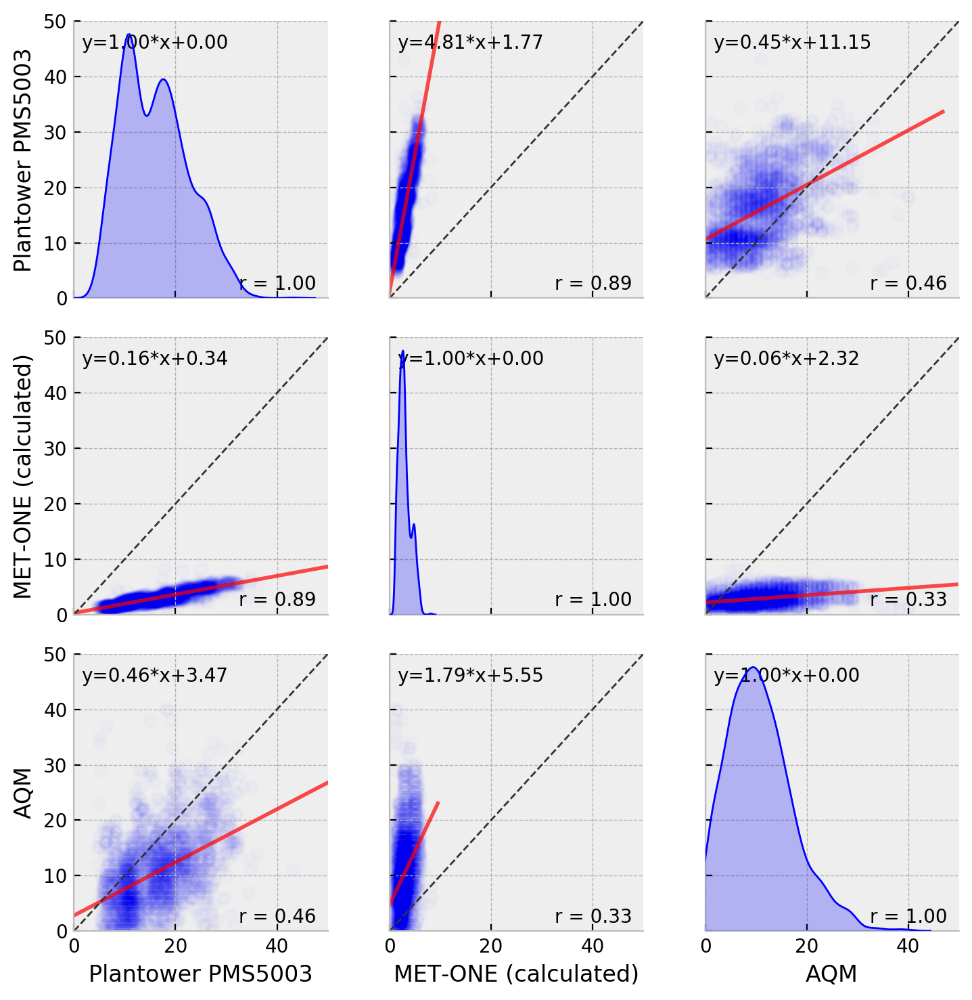

In [131]:
from scipy import stats
%config InlineBackend.figure_format = 'retina'
# plt.style.use('seaborn')
plt.style.use('bmh')
g = sns.pairplot(a, kind="reg",plot_kws={'scatter_kws':{'color':'b','linewidth':2,'alpha':0.01},
                                        'line_kws':{'color':'red','linewidth':2,'alpha':0.7},'robust':True,'ci':None},
                 diag_kws={'color':'b','linewidth':1},diag_kind="kde")
# robusr means it will give smaller weights to outliers
# ci = computational intensive 
 
g.map(corrfunc) 
g.map(lineReg) 

for i,ax in enumerate(g.axes.flat):
    if i in [0,4,8]:
        continue
    ax.plot((0, 50), (0, 50), c=".2", ls="--", linewidth=1)
#     ax.set_xlim(0, 50)
#     ax.set_ylim(0,50)
g.set(xlim=(0, 50), ylim=(0, 50));

plt.show();

In [439]:
# find optimal lag with maximum correlation. I think MET-ONE should be shifted (?). 
# FOR COUNTS (4 different signals) - shift the MET-ONE signal
#0.3

col_met = df_metOne_5min.columns[1::2]
col_sensor = df_sensor_2.columns[7:]
c = 0
shifts = np.arange(-24*12,24*12)

df_shifts = pd.DataFrame(index=np.arange(0,len(col_met)*len(shifts)),
                         columns=['shifts','count','correlation'])
ind = 0
for s in shifts:
    for c in range(len(col_met)):
        a=df_metOne_5min[col_met[c]]
        b=10*df_sensor_2_resemp[col_sensor[c]].shift(periods=s)
        mask_ab = ~np.isnan(a) & ~np.isnan(b) 
        df_shifts.iloc[ind] = [s,col_sensor[c],pearson(a[mask_ab],b[mask_ab])]
        ind += 1

In [440]:
df_shifts.set_index('shifts', inplace=True)
df_shifts.head()

,count,correlation
shifts,,
-288,0.3count,0.255721
-288,0.5count,-0.113004
-288,1count,-0.0650556
-288,2.5count,0.0678922
-287,0.3count,0.257311


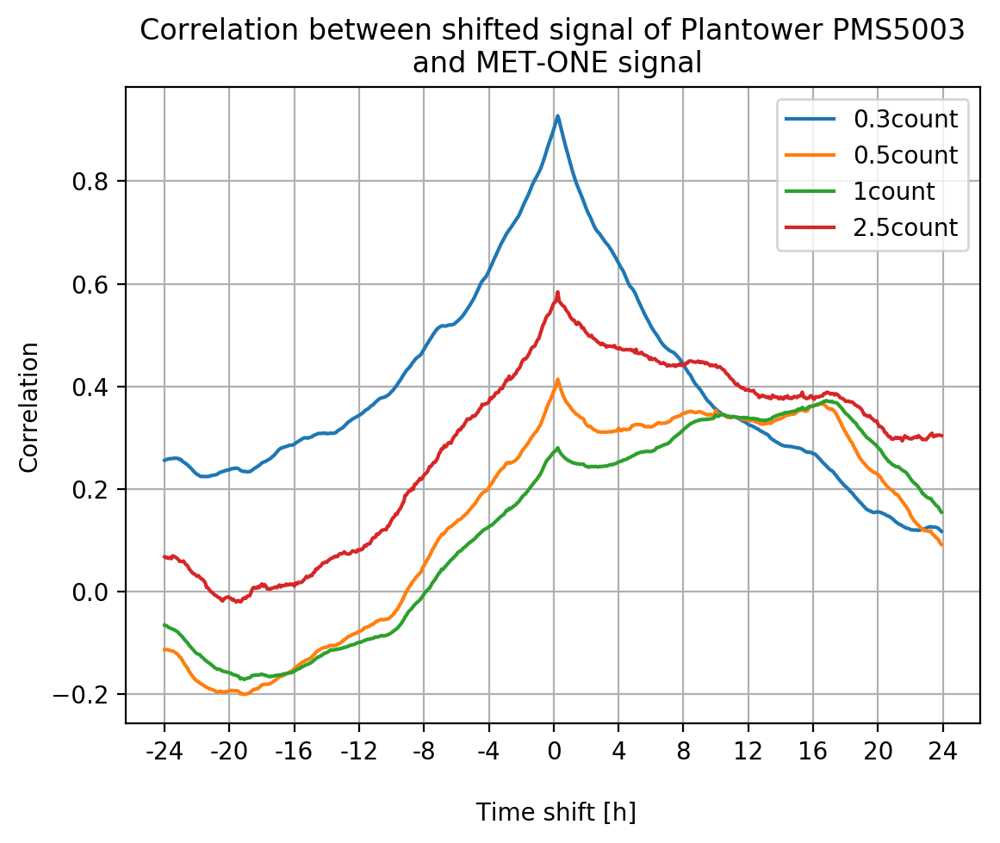

In [457]:
%config InlineBackend.figure_format = 'retina'
[ax1, ax2, ax3, ax4] = df_shifts.groupby('count')['correlation'].plot(legend=True)
ax1.set_ylabel('Correlation')
ax1.set_title('Correlation between shifted signal of Plantower PMS5003\n and MET-ONE signal')
ax1.set_xlabel('\n Time shift [h]')
ax1.set_xticks(np.arange(-288,289,48))
ax1.set_xticklabels(np.arange(-24,25,4))
ax1.grid(1,which='both')
plt.show();

In [458]:
df_shifts.groupby('count')['correlation'].max()

count
0.3count    0.927411
0.5count    0.414127
1count      0.372378
2.5count    0.584241
Name: correlation, dtype: float64

In [459]:
# calculate the hours shift where maximum correlation is
df_shifts[df_shifts.correlation == df_shifts.groupby('count')['correlation'].max()[0]].index/12
df_shifts[df_shifts.correlation == df_shifts.groupby('count')['correlation'].max()[1]].index/12
df_shifts[df_shifts.correlation == df_shifts.groupby('count')['correlation'].max()[2]].index/12
df_shifts[df_shifts.correlation == df_shifts.groupby('count')['correlation'].max()[3]].index/12

Float64Index([0.25], dtype='float64', name='shifts')

Float64Index([0.25], dtype='float64', name='shifts')

Float64Index([16.833333333333332], dtype='float64', name='shifts')

Float64Index([0.25], dtype='float64', name='shifts')

In [442]:
# FOR PM2.5 concentration - shift all signals and compare to AQM

sensors = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)']
c = 0
shifts = np.arange(-24*12,24*12)

df_shifts_25 = pd.DataFrame(index=np.arange(0,3*len(shifts)),
                         columns=['shifts','sensor','correlation'])
d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,df_sensor_2_resemp['PM2.5'].values,
                 mass_25.shift(periods=0).values,df_AQM['PM2.5'].values]))
a = pd.DataFrame(data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])

ind = 0
for s in shifts:
    for c in range(len(sensors)):
        sig_a = a[sensors[c]].shift(periods=s)
        sig_b = a.AQM
        mask_sig = ~np.isnan(sig_a) & ~np.isnan(sig_b) 
        df_shifts_25.iloc[ind] = [s,sensors[c],pearson(sig_a[mask_sig],sig_b[mask_sig])]
        ind += 1

In [443]:
df_shifts_25.set_index('shifts', inplace=True)
df_shifts_25.head()

,sensor,correlation
shifts,,
-288,NovaFit SDS021,-0.138111
-288,Plantower PMS5003,-0.121062
-288,MET-ONE (calculated),0.0142086
-287,NovaFit SDS021,-0.137961
-287,Plantower PMS5003,-0.122395


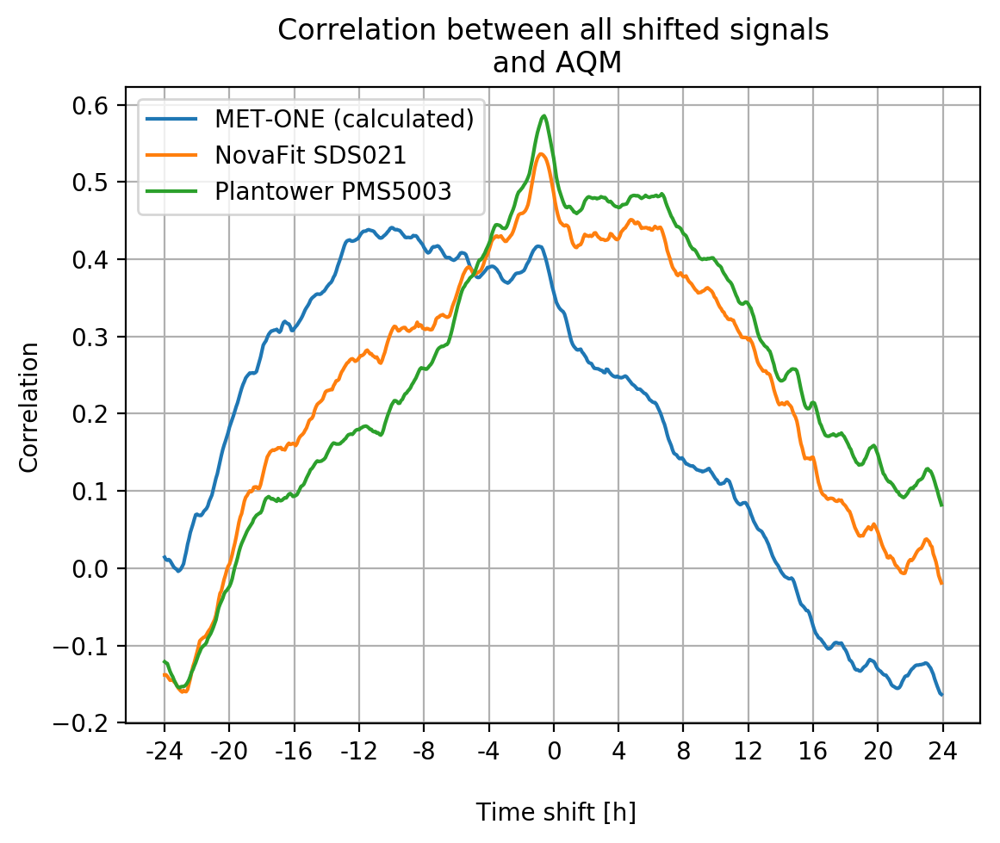

In [460]:
%config InlineBackend.figure_format = 'retina'
[ax1, ax2, ax3] = df_shifts_25.groupby('sensor')['correlation'].plot(legend=True)
ax1.set_ylabel('Correlation')
ax1.set_title('Correlation between all shifted signals\n and AQM')
ax1.set_xlabel('\n Time shift [h]')
ax1.set_xticks(np.arange(-288,289,48))
ax1.set_xticklabels(np.arange(-24,25,4))
ax1.grid(1,which='both')
plt.show();

In [445]:
df_shifts_25.groupby('sensor')['correlation'].max()

sensor
MET-ONE (calculated)    0.440840
NovaFit SDS021          0.536072
Plantower PMS5003       0.585612
Name: correlation, dtype: float64

In [446]:
# calculate the hours shift where maximum correlation is
df_shifts_25[df_shifts_25.correlation == df_shifts_25.groupby('sensor')['correlation'].max()[0]].index/12
df_shifts_25[df_shifts_25.correlation == df_shifts_25.groupby('sensor')['correlation'].max()[1]].index/12
df_shifts_25[df_shifts_25.correlation == df_shifts_25.groupby('sensor')['correlation'].max()[2]].index/12

Float64Index([-10.0], dtype='float64', name='shifts')

Float64Index([-0.75], dtype='float64', name='shifts')

Float64Index([-0.5833333333333334], dtype='float64', name='shifts')

In [467]:
# FOR PM2.5 concentration - see correlation with moving average

sensors = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)']
c = 0
window = np.arange(1,12*24)

df_window_25 = pd.DataFrame(index=np.arange(0,3*len(window)),
                         columns=['window','sensor','correlation'])
d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,df_sensor_2_resemp['PM2.5'].values,
                 mass_25.values,df_AQM['PM2.5'].values]))
a = pd.DataFrame(data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])

ind = 0
for w in window:
    for c in range(len(sensors)):
        sig_a = a[sensors[c]].rolling(window=w, center=True,min_periods=1).mean()
        sig_b = a.AQM.rolling(window=w, center=True,min_periods=1).mean()
        mask_sig = ~np.isnan(sig_a) & ~np.isnan(sig_b) 
        df_window_25.iloc[ind] = [w,sensors[c],stats.pearsonr(sig_a[mask_sig],sig_b[mask_sig])[0]]
        ind += 1

In [468]:
df_window_25.set_index('window', inplace=True)

In [508]:
plt.close('all')
plt.rcParams.update(plt.rcParamsDefault)

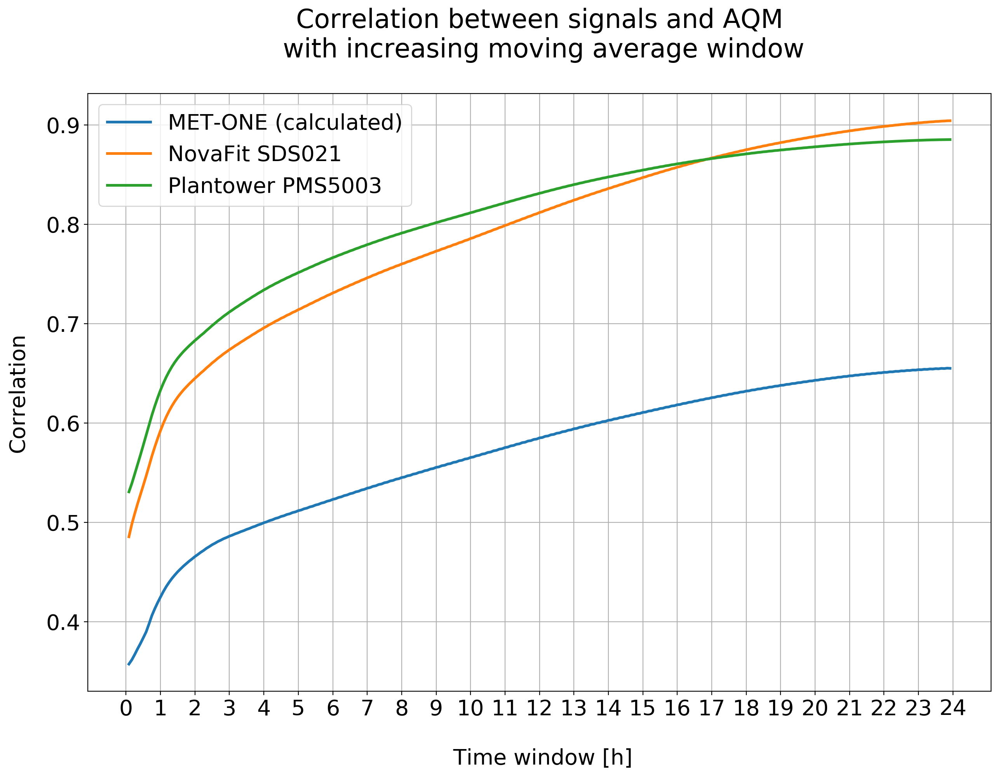

In [510]:
%config InlineBackend.figure_format = 'retina'
[ax1, ax2, ax3] = df_window_25.groupby('sensor')['correlation'].plot(legend=True,linewidth=2.5)
ax1.set_ylabel('Correlation',labelpad=16)
ax1.set_title('Correlation between signals and AQM\n with increasing moving average window\n')
ax1.set_xlabel('\n Time window [h]')
ax1.set_xticks(np.arange(0,24*12+1,12)) #not sure its exactly what should be
ax1.set_xticklabels(np.arange(0,25))
ax1.grid(1,which='both')

# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 20
# plt.savefig('Fig7.png',format='png', dpi=500)
plt.show();

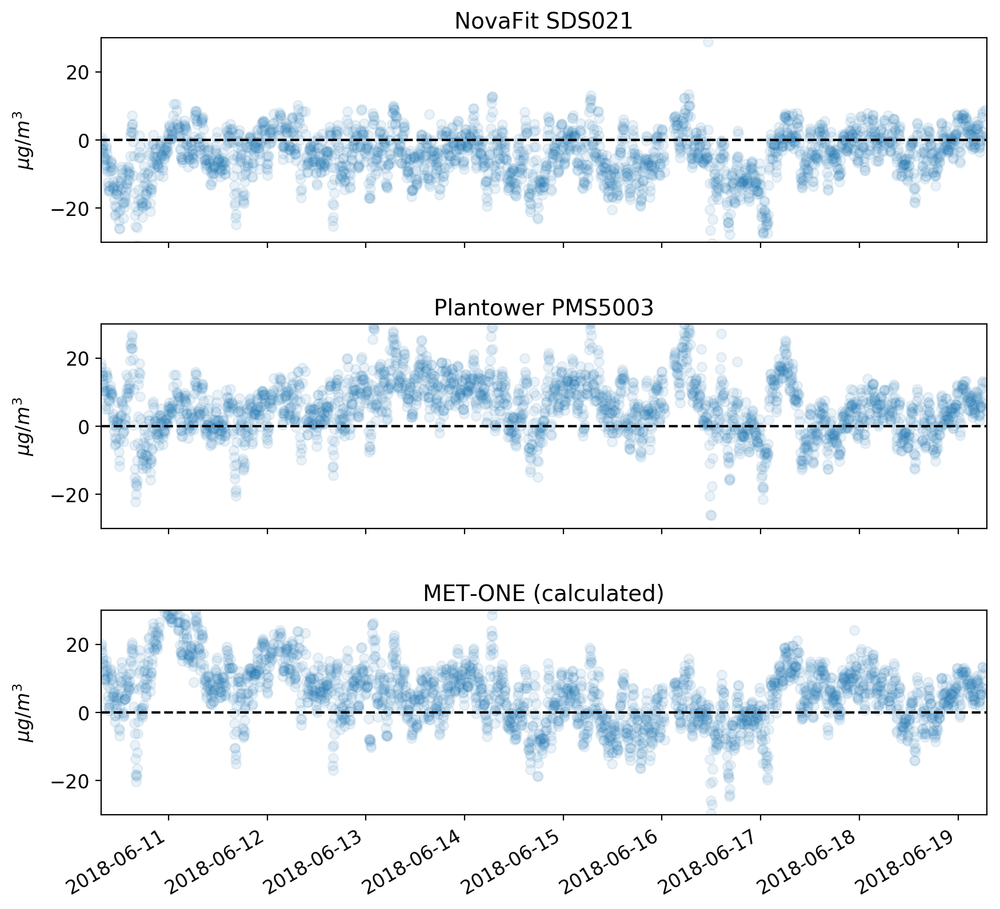

In [612]:
# pairplot of residuals in time


# plot signal SENSOR-2-PMS5003
%config InlineBackend.figure_format = 'retina'

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots(nrows=3, ncols=1)
fig.subplots_adjust(hspace=0.4, wspace=0.3)

d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,df_sensor_2_resemp['PM2.5'].values,
                 mass_25.values,df_AQM['PM2.5'].values]))
df = pd.DataFrame(index=df_sensor_1_resemp.index, data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])

tit = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)']
c=0

for i in range(3):
    ax[i].scatter(df.index, df[tit[c]]-df['AQM'],alpha = 0.09)

    ax[i].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
    ax[i].set_ylabel(r'$\mu g/m^3$',labelpad=9)
    ax[i].set_title(tit[c],fontsize = 14)
#         ax[i,j].grid(1,which='both')
    ax[i].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
    ax[i].set_xlim([df.index[0],df.index[-1]])
    ax[i].set_ylim([-30,30])
    ax[i].plot(df.index,np.zeros((len(df.index))),'--k') 
    c += 1

plt.rcParams['figure.figsize'] = (10, 10)
plt.rcParams['font.size'] = 12
fig.autofmt_xdate()
# plt.savefig('Fig8.png', format='png', dpi=500)
plt.show();




In [557]:
df.head()

,NovaFit SDS021,Plantower PMS5003,MET-ONE (calculated),AQM
date,,,,
2018-06-10 07:35:00,21.411371,42.476667,42.394860,24.0
2018-06-10 07:40:00,22.197324,39.849498,41.862956,22.4
2018-06-10 07:45:00,22.323333,37.516667,41.885765,21.7
2018-06-10 07:50:00,20.040134,37.167224,40.120498,22.5
2018-06-10 07:55:00,20.963211,35.411371,38.358254,23.9


In [621]:
# residuals calibrated

import seaborn as sns
shift_periods = 0

d = np.transpose(np.array([df_sensor_1_resemp['PM2.5'].values,
                           df_sensor_2_resemp['PM2.5'].values,
                 mass_25.shift(periods=shift_periods).values,
                           df_AQM['PM2.5'].values]))

a = pd.DataFrame(index=df_sensor_1_resemp.index, data = d, columns = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)','AQM'])


mask = a.isnull().any(axis = 1)
a.drop(a.loc[mask,:].index, inplace=True) #get ride of the NaNs since it's a problem to plot
# a.reset_index(drop=True, inplace=True)

reg1m = LinearRegression().fit(a['NovaFit SDS021'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
reg2m = LinearRegression().fit(a['Plantower PMS5003'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
reg3m = LinearRegression().fit(a['MET-ONE (calculated)'].values.reshape(-1,1), a['AQM'].values.reshape(-1,1))
# reg.coef_,reg.intercept_ 

reg1 = reg1m.predict(a['NovaFit SDS021'].values.reshape(-1,1))
reg2 = reg2m.predict(a['Plantower PMS5003'].values.reshape(-1,1))
reg3 = reg3m.predict(a['MET-ONE (calculated)'].values.reshape(-1,1))

# slope1, intercept1, _, _, _ = stats.linregress(a['AQM'],a['NovaFit SDS021'])
# slope2, intercept2, _, _, _ = stats.linregress(a['AQM'],a['Plantower PMS5003'])
# slope3, intercept3, _, _, _ = stats.linregress(a['AQM'],a['MET-ONE (calculated)'])

a['NovaFit SDS021'] = reg1#(a['NovaFit SDS021']-intercept1)/slope1
a['Plantower PMS5003'] = reg2#(a['Plantower PMS5003']-intercept2)/slope2
a['MET-ONE (calculated)'] = reg3#(a['MET-ONE (calculated)']-intercept3)/slope3
                           

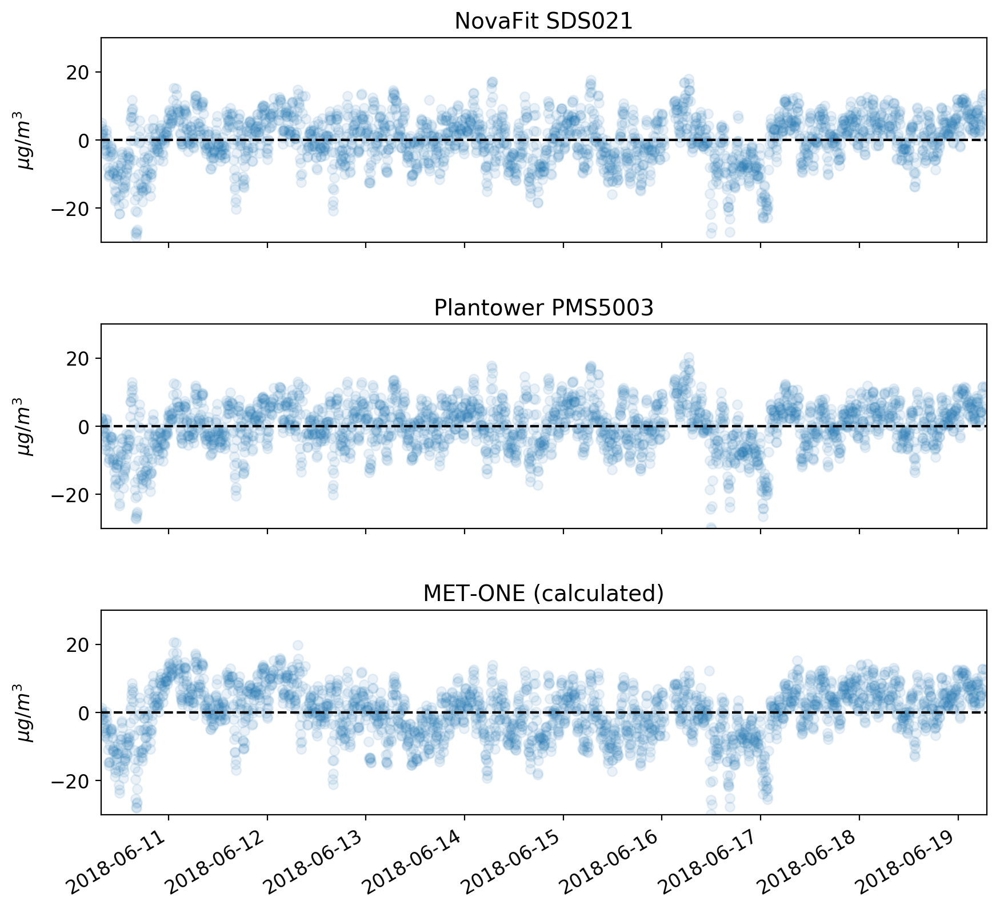

In [623]:
# residuals calibrated

%config InlineBackend.figure_format = 'retina'

fmt = "%Y-%m-%d %H:%M:%S"
fig, ax = plt.subplots(nrows=3, ncols=1)
fig.subplots_adjust(hspace=0.4, wspace=0.3)

tit = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)']
c=0

for i in range(3):
    ax[i].scatter(a.index, a[tit[c]]-a['AQM'],alpha = 0.09)

    ax[i].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
    ax[i].set_ylabel(r'$\mu g/m^3$',labelpad=9)
    ax[i].set_title(tit[c],fontsize = 14)
#         ax[i,j].grid(1,which='both')
    ax[i].xaxis.set_major_formatter(md.DateFormatter("%Y-%m-%d"))
    ax[i].set_xlim([a.index[0],a.index[-1]])
    ax[i].set_ylim([-30,30])
    ax[i].plot(a.index,np.zeros((len(a.index))),'--k') 
    c += 1

plt.rcParams['figure.figsize'] = (10, 10)
plt.rcParams['font.size'] = 12
fig.autofmt_xdate()
# plt.savefig('Fig9.png', format='png', dpi=500)
plt.show();


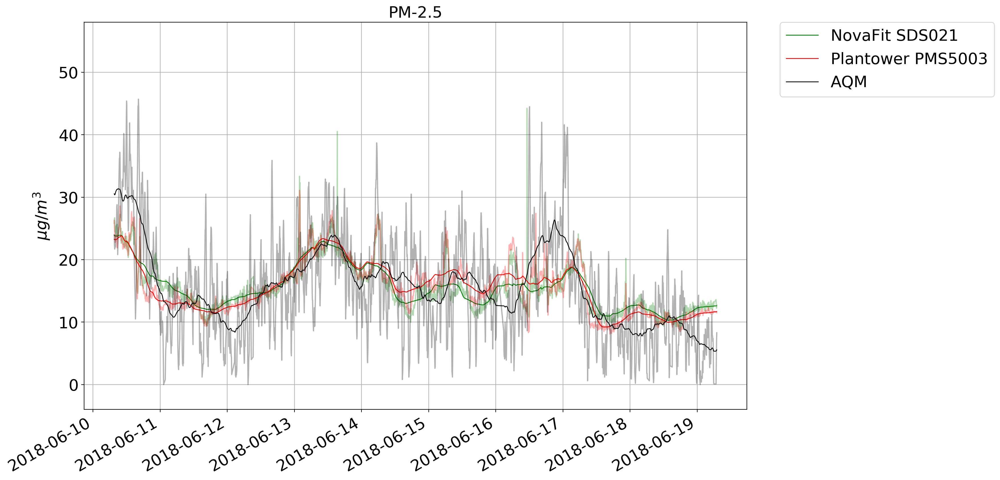

In [627]:
# signal after calibration
tit = ['NovaFit SDS021','Plantower PMS5003','MET-ONE (calculated)']
fig, ax = plt.subplots()
# --------- PM2.5 -----------
# plotTimeSeries(ax,0,1,df_sensor_2_resemp.index,df_sensor_2_resemp['PM1'],'r',100)
#sensor1
shift_periods=0
color = 'g'
ax.plot(a.index, a['NovaFit SDS021'], color, alpha = 0.3,label='_nolegend_')
ax.plot(a.index, a['NovaFit SDS021'].rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='NovaFit SDS021')
ax.set_ylabel(r'$\mu g/m^3$',labelpad=9)

#sensor2
shift_periods=0
color = 'r'
ax.plot(a.index, a['Plantower PMS5003'], color, alpha = 0.3,label='_nolegend_')
ax.plot(a.index, a['Plantower PMS5003'].rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='Plantower PMS5003')

# #MET-ONE(using factors,mass_25)
# shift_periods=0
# color = 'b'
# ax.plot(a.index, a['MET-ONE (calculated)'], color, alpha = 0.3,label='_nolegend_')
# ax.plot(a.index, a['MET-ONE (calculated)'].rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='MET-ONE (calculated)')

#AQM
shift_periods=0
color = 'k'
ax.plot(a.index, a['AQM'], color, alpha = 0.3,label='_nolegend_')
ax.plot(a.index, a['AQM'].rolling(window=120, center=True, min_periods=1).mean(),color,linewidth=1,linestyle='solid',label='AQM')

ax.set_title('PM-2.5',fontsize = 20)
ax.set_ylim(-4,58)
lgd = ax.legend(bbox_to_anchor=(1.05, 1),loc=2,fontsize = 20,borderaxespad=0.)


# set parameters
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 20
fig.autofmt_xdate()
ax.grid(1,which='both')
# fig.savefig('Fig10.png', bbox_extra_artists=(lgd,), bbox_inches='tight',format='png', dpi=500)
plt.show();


In [ ]:
# ADD UNITS AND TITLES TO PLOTS

In [ ]:
# ADD A PLOT AFTER LINEAR CALIBRATION

In [ ]:
# compare each sensor using scatter and residuals comparison. 
# I think residuals change in time or in some relation to a certain parameter

In [ ]:
# maybe look at the percentage of time the data is not reliable (zero values, PM low bigger than PM high)
# for all three devices

In [ ]:
# find daily patterns in signal 

In [121]:
# Find the optimal lag time - the one with maximum correlation. 
# maybe use a Fourier transform to find it

In [122]:
# calculate correlation for different time averaging (df.resample)
# (WRITE A FUNCTION FOR THAT)

In [123]:
# look at residuals(diff between signals) during time

# Our cool experiment - putting the sensors in a fume hood

In [146]:
# from IPython.display import Math
# Math(r'F(k) = \int_{-\infty}^{\infty} f(x) e^{2\pi i k} dx')

# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

# Math(r'V\cdot \frac{dc(t)}{dt} = q\cdot A_{1} - u\cdot A_{2}\cdot c(t)')
# Math(r'given\hspace{0.5cm} q\cdot A_{1} = E\hspace{0.5cm}')
# Math(r'mark\hspace{0.5cm} \alpha = u\cdot A_{2}')
# \newline
# c(t) = const\cdot e^{\frac{-\alpha \cdot t}{V}}+\frac{E}{\alpha}
# \newline
# \int \frac{V\cdot{dc(t)}}{E-\alpha\cdot c(t)}dc = \int dt
# \newline
# \frac{-V}{\alpha}\cdot\ln (E-\alpha\cdot c(t)) +C_1 = t + C_2 
# \newline
# \newline
# c(t) = C^*\cdot\exp (\frac{\alpha\cdot t}{V})+\frac{E}{\alpha}

 



<div style="text-align: right"> שאלות לברק - איך מוצאים את הלג הכי טוב, איך יודעים מי טועה בזמן אם בכלל, איך מחשבים את הפקטור למעבר בין מספר חלקיקים לריכוז מסי, האם צריך לדעת התפלגות של קוטר החלקיקים, איזה קורלציה להשתמש, להשוות לתוצאות של זואי, לא ברור לי באיזה נתוני מט וואן היא השתמשה בגלל שזה קאונט, האם להציג בקאונט בין גודל לגודל או רק מה שגדול מ </div>



In [5]:
# plt.style.available